In [ ]:
!uv pip install git+https://github.com/gagan3012/ltr

Streaming output truncated to the last 5000 lines.
nnsight    ------------------------------ 32.26 KiB/100.82 KiB
fsspec     ------------------------------ 3.15 KiB/189.08 KiB
msgspec    ------------------------------ 14.91 KiB/205.74 KiB
datasets   ------------------------------ 102.97 KiB/480.03 KiB
nvidia-cuda-runtime-cu12 ------------------------------ 203.44 KiB/863.02 KiB
jedi       ------------------------------ 14.87 KiB/1.50 MiB
nvidia-cuda-cupti-cu12 ------------------------------ 14.89 KiB/13.17 MiB
nvidia-nvjitlink-cu12 ------------------------------ 330.96 KiB/20.09 MiB
nvidia-cuda-nvrtc-cu12 ------------------------------ 365.97 KiB/23.50 MiB
nvidia-curand-cu12 ------------------------------ 14.89 KiB/53.70 MiB
bitsandbytes ------------------------------ 32.00 KiB/69.49 MiB
nvidia-cusolver-cu12 ------------------------------ 313.33 KiB/122.01 MiB
   Building lime==0.2.0.1
   Building baukit @ git+https://github.com/davidbau/baukit@9d51abd51ebf29769aecc38c
   Building ltr 

In [ ]:
# !git clone https://github.com/gagan3012/llm-thought-tracing
# %cd llm-thought-tracing
# !pip install git+https://github.com/davidbau/baukit datasets bitsandbytes nnsight lime shap --upgrade

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from typing import List, Dict, Optional, Tuple
from IPython.display import display, HTML
import os
import matplotlib.animation as animation
from transformers import AutoModelForCausalLM, AutoTokenizer
from scipy.ndimage import gaussian_filter
from baukit import TraceDict
from IPython.display import HTML


# Import LTR functions
from ltr.concept_extraction import (
    extract_concept_activations,
    get_layer_pattern_and_count,
)
from ltr.visualization import (
    plot_concept_activation_heatmap,
    animate_concept_activation_diagonal,
)

from matplotlib.colors import Normalize           # already imported? leave it.

# def _choose_edge_cmap(edge_data, threshold=0.3):
#     """
#     Decide which colormap & normalisation to use for the current set of edges.

#     • If at least one edge has a negative correlation → diverging 'coolwarm'
#     • If all correlations are positive              → sequential 'Reds'
#       (and we stretch it over [threshold … 1] so the full
#        light-pink → dark-crimson ramp is available).
#     """
#     any_negative = any(d["correlation"] < 0 for _, _, d in edge_data)

#     if any_negative:
#         cmap  = plt.get_cmap("coolwarm")
#         norm  = Normalize(vmin=-1, vmax=1)
#         value = lambda r: r            # keep the sign
#     else:
#         cmap  = plt.get_cmap("Reds")   # pick any sequential palette you like
#         norm  = Normalize(vmin=threshold, vmax=1)
#         value = abs                    # only magnitude matters

#     return cmap, norm, value

def _choose_edge_cmap(edge_data, threshold=0.3):
    """
    Decide which colormap & normalisation to use for the current set of edges.

    • If at least one edge has a negative correlation → diverging 'coolwarm'
    • If all correlations are positive              → sequential colormap
      with better contrast by using a more restricted range.
    """
    correlations = [d["correlation"] for _, _, d in edge_data]
    min_corr = min(correlations)
    max_corr = max(correlations)

    any_negative = min_corr < 0

    if any_negative:
        cmap = plt.get_cmap("coolwarm")
        norm = Normalize(vmin=-1, vmax=1)
        value = lambda r: r  # keep the sign
    else:
        # Use a colormap that shows more variation for positive values
        cmap = plt.get_cmap("plasma")  # or "viridis", "inferno", "magma"
        # Use actual data range instead of fixed threshold
        norm = Normalize(vmin=min_corr, vmax=max_corr)
        value = abs  # only magnitude matters

    return cmap, norm, value


def analyze_concept_distributions(
    model,
    tokenizer,
    prompt: str,
    concepts: List[str],
    output_dir: Optional[str] = None,
    figsize=(14, 8),
    max_new_tokens: int = 250,
    num_layers_to_show: int = 5,
    custom_layer_indices: Optional[List[int]] = None,
) -> Tuple[str, Dict]:
    """
    Analyze distributional semantics of concepts across model layers.

    Parameters:
    -----------
    model : transformers model
        The language model to analyze
    tokenizer : transformers tokenizer
        Tokenizer for the model
    prompt : str
        Input prompt to process
    concepts : List[str]
        List of concepts to track through the model
    output_dir : Optional[str]
        Directory to save visualizations (if None, won't save)
    figsize : tuple
        Default figure size
    max_new_tokens : int
        Maximum number of new tokens to generate

    Returns:
    --------
    Tuple[str, Dict]
        Generated completion and results dictionary with visualizations
    """
    # Generate completion from the model
    messages = [{"role": "user", "content": prompt}]
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True,
        enable_thinking=False,  # Switches between thinking and non-thinking modes. Default is True.
    )
    inputs = tokenizer([text], return_tensors="pt").to(model.device)
    with torch.no_grad():
        outputs = model.generate(
            inputs.input_ids,
            max_new_tokens=max_new_tokens,
            do_sample=True,
            temperature=0.7,
            return_dict_in_generate=True,
            output_scores=True,
        )

    # Get the generated text
    generated_ids = outputs.sequences[0][inputs.input_ids.shape[1] :]
    completion = tokenizer.decode(generated_ids, skip_special_tokens=True)

    # Full text (prompt + completion)
    full_text = prompt

    # Extract concept activations
    concept_results = extract_concept_activations(
        model, tokenizer, full_text, intermediate_concepts=concepts, final_concepts=[]
    )

    # Create visualizations
    results = {
        "prompt": prompt,
        "completion": completion,
        "full_text": full_text,
        "concept_results": concept_results,
        "visualizations": {},
    }

    # 1. Standard heatmap visualization
    print("1. Heatmap Viz")
    fig_heatmap = plot_concept_activation_heatmap(
        concept_results,
        selected_concepts=concepts,
        figsize_per_concept=(figsize[0], figsize[1] / len(concepts)),
    )
    results["visualizations"]["heatmap"] = fig_heatmap

    # 2. Distributional semantics visualization
    print("2. Distributional Viz")
    fig_dist = visualize_concept_distributional_semantics(
        concept_results,
        concepts,
        figsize=figsize,
        num_layers_to_show=num_layers_to_show,
        custom_layer_indices=custom_layer_indices,
    )
    results["visualizations"]["distributional"] = fig_dist

    # 3. Layer comparison visualization
    print("3. Layer Comparison Viz")
    fig_layers = visualize_concept_layer_comparison(
        concept_results, concepts, figsize=figsize
    )
    results["visualizations"]["layer_comparison"] = fig_layers

    # 4. Semantic connections visualization
    print("4. Semantic Connections Viz")
    if len(concepts) >= 2:
        fig_connections = visualize_concept_semantic_connections(
            concept_results, concepts, figsize=figsize
        )
        results["visualizations"]["semantic_connections"] = fig_connections

    # 5. Create animated visualizations
    print("5. Animated Viz")
    for concept in concepts:
        animation = animate_concept_activation_diagonal(
            concept_results,
            selected_concepts=[concept],
            figsize=(figsize[0], figsize[1] / 2),
        )
        results["visualizations"][f"animation_{concept}"] = animation

    # 6. Network graph visualization
    print("6. Network Graph Viz")
    if len(concepts) >= 2:
        fig_network = visualize_concept_network_graphv2(
            concept_results, concepts, figsize=figsize,
            custom_layer_indices=custom_layer_indices,
            sample_layers=num_layers_to_show,
        )
        results["visualizations"]["network_graph"] = fig_network

    # Save visualizations if output_dir is provided
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        fig_heatmap.savefig(
            os.path.join(output_dir, "concept_heatmap.png"),
            bbox_inches="tight",
            dpi=300,
        )
        fig_dist.savefig(
            os.path.join(output_dir, "concept_distribution.png"),
            bbox_inches="tight",
            dpi=300,
        )
        fig_layers.savefig(
            os.path.join(output_dir, "layer_comparison.png"),
            bbox_inches="tight",
            dpi=300,
        )
        if len(concepts) >= 2:
            fig_connections.savefig(
                os.path.join(output_dir, "semantic_connections.png"),
                bbox_inches="tight",
                dpi=300,
            )
            for i, fig in enumerate(fig_network):
              fig.savefig(
                  os.path.join(output_dir, f"network_graph_layer_{i}.png"),
                  bbox_inches="tight",
                  dpi=300,
              )

    return completion, results


def visualize_concept_distributional_semantics(
    concept_results: Dict,
    selected_concepts: Optional[List[str]] = None,
    num_layers_to_show: int = 5,
    custom_layer_indices: Optional[List[int]] = None,
    figsize=(14, 10),
) -> plt.Figure:
    """
    Visualize how concept distributional semantics change across layers.

    Parameters:
    -----------
    concept_results : Dict
        Results from extract_concept_activations
    selected_concepts : Optional[List[str]]
        Specific concepts to visualize
    num_layers_to_show : int
        Number of layers to show (evenly distributed)
    figsize : tuple
        Figure size

    Returns:
    --------
    plt.Figure
        Figure with visualizations
    """
    all_concepts = (
        concept_results["intermediate_concepts"] + concept_results["final_concepts"]
    )
    if selected_concepts is None:
        selected_concepts = all_concepts
    else:
        selected_concepts = [c for c in selected_concepts if c in all_concepts]

    if not selected_concepts:
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.text(
            0.5,
            0.5,
            "No valid concepts to display",
            ha="center",
            va="center",
            fontsize=14,
        )
        ax.axis("off")
        return fig

    # Get token information
    tokens = concept_results["tokens"][1:]  # Skip first token (usually BOS)
    n_tokens = len(tokens)

    # Get layer information
    grid = concept_results["activation_grid"][selected_concepts[0]]
    n_layers = grid.shape[0]

    # Select layers to visualize (evenly distributed)
    if custom_layer_indices is not None:
        # Use custom indices but ensure they're valid
        layer_indices = [idx for idx in custom_layer_indices if 0 <= idx < n_layers]
        # If no valid indices, fall back to default
        if not layer_indices:
            layer_indices = np.linspace(0, n_layers - 1, num_layers_to_show, dtype=int)
    else:
        # Original approach - evenly spaced layers
        if num_layers_to_show > n_layers:
            num_layers_to_show = n_layers
        layer_indices = np.linspace(0, n_layers - 1, num_layers_to_show, dtype=int)

    # Update number of layers to match actual number being displayed
    # num_layers_to_show = len(layer_indices)

    # layer_indices = np.linspace(0, n_layers - 1, num_layers_to_show, dtype=int)

    # Create figure
    n_concepts = len(selected_concepts)
    fig, axes = plt.subplots(
        num_layers_to_show, 1, figsize=figsize, sharex=True, squeeze=False
    )

    # Create color palette
    concept_colors = sns.color_palette("husl", n_concepts)

    # For each selected layer
    for i, layer_idx in enumerate(layer_indices):
        ax = axes[i, 0]

        # Plot distribution for each concept at this layer
        for j, concept in enumerate(selected_concepts):
            # Get activation at this layer across tokens
            grid = concept_results["activation_grid"][concept]
            activations = grid[layer_idx, :]

            # Plot as distribution
            sns.kdeplot(
                activations,
                ax=ax,
                label=concept,
                color=concept_colors[j],
                fill=True,
                alpha=0.3,
            )

            # Mark top activation positions
            top_k = 3
            top_indices = np.argsort(activations)[-top_k:]
            top_values = activations[top_indices]

            for idx, val in zip(top_indices, top_values):
                if idx < len(tokens):
                    ax.scatter(
                        val,
                        0.01,  # small y-value for visibility on distribution
                        color=concept_colors[j],
                        s=50,
                        alpha=0.8,
                        marker="^",
                        zorder=5,
                    )
                    ax.annotate(
                        tokens[idx],
                        (val, 0.02),
                        fontsize=8,
                        color=concept_colors[j],
                        ha="center",
                        va="bottom",
                        rotation=45,
                    )

        ax.set_ylabel(f"Layer {layer_idx}\nDensity", fontsize=10)

        if i == 0:
            ax.legend(title="Concepts", bbox_to_anchor=(1.01, 1), loc="upper left")

        if i == num_layers_to_show - 1:
            ax.set_xlabel("Activation Strength", fontsize=12)

    plt.suptitle(
        "Distributional Semantics of Concepts Across Layers", fontsize=16, y=0.98
    )
    plt.subplots_adjust(hspace=0.3, right=0.85)

    return fig

import networkx as nx
from matplotlib.cm import get_cmap


def visualize_concept_network_graph(
    concept_results: Dict,
    selected_concepts: Optional[List[str]] = None,
    sample_layers: int = 4,
    custom_layer_indices: Optional[List[int]] = None,
    correlation_threshold: float = 0.3,
    figsize=(16, 14),
) -> plt.Figure:
    """
    Visualize network graph showing relationships between concepts across layers.

    Parameters:
    -----------
    concept_results : Dict
        Results from extract_concept_activations
    selected_concepts : Optional[List[str]]
        Specific concepts to visualize
    sample_layers : int
        Number of sample layers to visualize
    correlation_threshold : float
        Minimum correlation to show an edge in the graph
    figsize : tuple
        Figure size

    Returns:
    --------
    plt.Figure
        Figure with network graph visualizations
    """
    all_concepts = (
        concept_results["intermediate_concepts"] + concept_results["final_concepts"]
    )
    if selected_concepts is None:
        selected_concepts = all_concepts
    else:
        selected_concepts = [c for c in selected_concepts if c in all_concepts]

    if not selected_concepts or len(selected_concepts) < 2:
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.text(
            0.5,
            0.5,
            "Need at least 2 valid concepts to display network",
            ha="center",
            va="center",
            fontsize=14,
        )
        ax.axis("off")
        return fig

    # Get grid dimensions
    grid = concept_results["activation_grid"][selected_concepts[0]]
    n_layers, n_tokens = grid.shape

    # Select layers to sample
    if sample_layers > n_layers:
        sample_layers = n_layers

    if custom_layer_indices is not None:
        # Use custom indices but ensure they're valid
        layer_indices = [
            idx for idx in custom_layer_indices if 0 <= idx < n_layers
        ]
        layer_indices = list(set(layer_indices))
    else:
        layer_indices = np.linspace(0, n_layers - 1, sample_layers, dtype=int)

    # Create figure
    rows, cols = len(layer_indices)//3 + 1, 3
    fig, axes = plt.subplots(rows, cols, figsize=figsize, squeeze=False)

    total_needed = len(layer_indices)
    for j in range(total_needed, rows * cols):
        fig.delaxes(axes.flatten()[j])

    # Get tokens
    tokens = concept_results["tokens"][1:]

    # Create colormap for edge weights
    edge_cmap = get_cmap("coolwarm")

    # For each selected layer
    for i, layer_idx in enumerate(layer_indices):
        r = i // cols                                # row for this layer
        c = i % cols                                 # col (0, 1, 2)
        ax = axes[r, c]
        # fig, ax = plt.subplots(figsize=figsize)

        # Create graph
        G = nx.Graph()

        # Add nodes (concepts)
        for concept in selected_concepts:
            G.add_node(concept)

        # Get activation vectors for each concept at this layer
        activation_vectors = {}
        for concept in selected_concepts:
            grid = concept_results["activation_grid"][concept]
            activation_vectors[concept] = grid[layer_idx, :]

        # Compute correlations and add edges
        max_corr = 0.1  # For edge width scaling
        for c1_idx, concept1 in enumerate(selected_concepts):
            for c2_idx, concept2 in enumerate(
                selected_concepts[c1_idx + 1 :], c1_idx + 1
            ):
                # Calculate correlation between activation patterns
                corr = np.corrcoef(
                    activation_vectors[concept1], activation_vectors[concept2]
                )[0, 1]

                # Only add edge if correlation is significant
                if abs(corr) >= correlation_threshold:
                    G.add_edge(concept1, concept2, weight=abs(corr), correlation=corr)
                    max_corr = max(max_corr, abs(corr))

        # Position nodes using spring layout
        pos = nx.spring_layout(G, k=1.5, seed=42)

        # Draw nodes
        nx.draw_networkx_nodes(
            G,
            pos,
            ax=ax,
            node_size=1000,
            node_color="lightblue",
            edgecolors="black",
            alpha=0.7,
        )

        # Draw node labels
        nx.draw_networkx_labels(G, pos, ax=ax, font_size=10, font_weight="bold")

        # Draw edges with color based on positive/negative correlation
        # and width based on correlation strength
        for u, v, d in G.edges(data=True):
            corr = d["correlation"]
            # Normalize correlation value to color range (-1 to 1) -> (0 to 1)
            color_val = (corr + 1) / 2
            # Draw edge
            nx.draw_networkx_edges(
                G,
                pos,
                ax=ax,
                edgelist=[(u, v)],
                width=5 * abs(corr) / max_corr,
                alpha=0.7,
                edge_color=[edge_cmap(color_val)],
            )

        # Add colorbar for edge colors
        sm = plt.cm.ScalarMappable(cmap=edge_cmap)
        sm.set_array(np.linspace(-1, 1, 100))
        cbar = plt.colorbar(sm, ax=ax, orientation="vertical", shrink=0.7)
        cbar.set_label("Correlation", fontsize=10)

        ax.set_title(f"Layer {layer_idx}: Concept Relationship Network", fontsize=12)
        ax.axis("off")

    plt.suptitle("Semantic Concept Network Across Layers", fontsize=16, y=0.98)
    plt.subplots_adjust(hspace=0.3)

    return fig

def visualize_concept_network_graphv2(
    concept_results: Dict,
    selected_concepts: Optional[List[str]] = None,
    sample_layers: int = 4,
    custom_layer_indices: Optional[List[int]] = None,
    correlation_threshold: float = 0,
    figsize=(16, 14),
    force_light_mode: bool = True,  # <— NEW: switch to control light / dark style
) -> List[plt.Figure]:
    """
    Visualize a network graph that shows relationships between concepts across layers.

    This version defaults to a **light** appearance (white background, dark text).
    You can set ``force_light_mode=False`` if you would like to respect whatever
    global Matplotlib style is active instead.

    Parameters
    ----------
    concept_results : Dict
        Output from ``extract_concept_activations``.
    selected_concepts : list[str] | None, optional
        Sub‑set of concepts to visualise; if *None* all concepts are used.
    sample_layers : int, default=4
        Number of layers to sample/plot.
    custom_layer_indices : list[int] | None, optional
        Explicit layer indices to plot instead of evenly spaced samples.
    correlation_threshold : float, default=0.5
        Minimum absolute correlation required for an edge to be drawn.
    figsize : tuple[int, int], default=(16, 14)
        Dimensions for each individual layer figure.
    force_light_mode : bool, default=True
        When *True* the function overrides any active dark‑background style
        so the result appears on a white canvas with dark annotation colours.

    Returns
    -------
    list[matplotlib.figure.Figure]
        One ``Figure`` per sampled layer (handy for saving individually).
    """

    # ------------------------------------------------------------------
    # 1. Configure style so we always draw on a light background unless the
    #    caller explicitly turns that off. We do this *inside* the function so
    #    it never has global side‑effects.
    # ------------------------------------------------------------------
    style_ctx = plt.style.context('default') if force_light_mode else plt.NullContext()
    with style_ctx:
        # (Optional) ensure white canvas even if user has a custom rcParam
        plt.rcParams["figure.facecolor"] = "white"
        plt.rcParams["axes.facecolor"] = "white"
        plt.rcParams["savefig.facecolor"] = "white"

        # ------------------------------------------------------------------
        # 2. Validate & prepare inputs
        # ------------------------------------------------------------------
        all_concepts = (
            concept_results["intermediate_concepts"] + concept_results["final_concepts"]
        )
        if selected_concepts is None:
            selected_concepts = all_concepts
        else:
            selected_concepts = [c for c in selected_concepts if c in all_concepts]

        if len(selected_concepts) < 2:
            fig, ax = plt.subplots(figsize=(6, 4), facecolor="white")
            ax.text(
                0.5,
                0.5,
                "Need at least 2 valid concepts to display network",
                ha="center",
                va="center",
                fontsize=14,
                color="black",
            )
            ax.axis("off")
            return [fig]

        # ------------------------------------------------------------------
        # 3. Figure out which layers to visualise
        # ------------------------------------------------------------------
        n_layers, _ = concept_results["activation_grid"][selected_concepts[0]].shape
        if sample_layers > n_layers:
            sample_layers = n_layers

        if custom_layer_indices is not None:
            layer_indices = sorted({idx for idx in custom_layer_indices if 0 <= idx < n_layers})
        else:
            layer_indices = np.linspace(0, n_layers - 1, sample_layers, dtype=int)

        # ------------------------------------------------------------------
        # 4. Build one figure per requested layer
        # ------------------------------------------------------------------
        edge_cmap = get_cmap("seismic")
        figures: list[plt.Figure] = []

        for layer_idx in layer_indices:
            fig, ax = plt.subplots(figsize=figsize, facecolor="white")

            # --‑‑ Build the graph ------------------------------------------------
            G = nx.Graph()
            G.add_nodes_from(selected_concepts)

            # Pre‑fetch activation vectors for speed
            activation_vectors = {
                concept: concept_results["activation_grid"][concept][layer_idx, :]
                for concept in selected_concepts
            }

            # Compute correlations & populate edges
            max_corr_seen = 0.1  # avoids division by 0 during first draw
            for i, c1 in enumerate(selected_concepts):
                for c2 in selected_concepts[i + 1 :]:
                    corr = np.corrcoef(activation_vectors[c1], activation_vectors[c2])[0, 1]
                    if abs(corr) >= correlation_threshold:
                        G.add_edge(c1, c2, weight=abs(corr), correlation=corr)
                        max_corr_seen = max(max_corr_seen, abs(corr))

            # Fast‑exit if no significant correlations for this layer
            if G.number_of_edges() == 0:
                ax.text(
                    0.5,
                    0.5,
                    f"No edges (|r| ≥ {correlation_threshold}) in layer {layer_idx}",
                    ha="center",
                    va="center",
                    fontsize=12,
                    color="black",
                )
                ax.axis("off")
                figures.append(fig)
                continue

            # --‑‑ Draw the graph ----------------------------------------------
            pos = nx.spring_layout(G, k=1.5, seed=42)

            nx.draw_networkx_nodes(
                G,
                pos,
                node_size=1000,
                node_color="#add8e6",  # light‑blue works on white background
                edgecolors="black",
                linewidths=1.0,
                ax=ax,
            )
            nx.draw_networkx_labels(G, pos, ax=ax, font_size=10, font_weight="bold", font_color="black")

            for u, v, data in G.edges(data=True):
                corr = data["correlation"]
                color_val = corr #(corr + 1) / 2  # map –1…1 ➔ 0…1 for colormap
                nx.draw_networkx_edges(
                    G,
                    pos,
                    edgelist=[(u, v)],
                    width=5 * abs(corr) / max_corr_seen,
                    edge_color=[edge_cmap(color_val)],
                    alpha=0.8,
                    ax=ax,
                )

            # --‑‑ Colour‑bar ---------------------------------------------------
            sm = plt.cm.ScalarMappable(cmap=edge_cmap, norm=plt.Normalize(vmin=-1, vmax=1))
            sm.set_array([])  # required for Matplotlib ≥3.8
            cbar = plt.colorbar(sm, ax=ax, orientation="vertical", shrink=0.7)
            cbar.set_label("Correlation", fontsize=10, color="black")
            cbar.ax.yaxis.set_tick_params(color="black")
            plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='black')

            # --‑‑ Finishing touches -------------------------------------------
            ax.set_title(f"Layer {layer_idx}: Concept Relationship Network", fontsize=12, color="black")
            ax.axis("off")
            figures.append(fig)

        return figures


def visualize_concept_layer_comparison(
    concept_results: Dict,
    selected_concepts: Optional[List[str]] = None,
    figsize=(14, 8),
) -> plt.Figure:
    """
    Visualize how concepts are distributed across layers.

    Parameters:
    -----------
    concept_results : Dict
        Results from extract_concept_activations
    selected_concepts : Optional[List[str]]
        Specific concepts to visualize
    figsize : tuple
        Figure size

    Returns:
    --------
    plt.Figure
        Figure with visualizations
    """
    all_concepts = (
        concept_results["intermediate_concepts"] + concept_results["final_concepts"]
    )
    if selected_concepts is None:
        selected_concepts = all_concepts
    else:
        selected_concepts = [c for c in selected_concepts if c in all_concepts]

    if not selected_concepts:
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.text(
            0.5,
            0.5,
            "No valid concepts to display",
            ha="center",
            va="center",
            fontsize=14,
        )
        ax.axis("off")
        return fig

    # Get grid dimensions
    grid = concept_results["activation_grid"][selected_concepts[0]]
    n_layers, n_tokens = grid.shape

    # Create figure
    fig, axes = plt.subplots(
        1, len(selected_concepts), figsize=figsize, sharey=True, squeeze=False
    )

    # For each concept
    for i, concept in enumerate(selected_concepts):
        ax = axes[0, i]

        # Get layer-wise maximum activations
        layer_max = concept_results["layer_max_probs"].get(concept, np.zeros(n_layers))

        # Get layer-wise mean activations
        grid = concept_results["activation_grid"][concept]
        layer_mean = np.mean(grid, axis=1)

        # Plot
        ax.plot(
            layer_max,
            np.arange(n_layers),
            color="darkred",
            label="Max",
            marker="o",
            markersize=4,
            linestyle="-",
            linewidth=2,
            alpha=0.8,
        )
        ax.plot(
            layer_mean,
            np.arange(n_layers),
            color="navy",
            label="Mean",
            marker="s",
            markersize=3,
            linestyle="--",
            linewidth=1.5,
            alpha=0.7,
        )

        ax.set_title(concept, fontsize=12)
        ax.set_xlabel("Activation Strength", fontsize=10)

        if i == 0:
            ax.set_ylabel("Layer", fontsize=12)
            ax.legend()

        # Invert y-axis to have early layers at the top
        ax.invert_yaxis()

        # Add grid
        ax.grid(alpha=0.3, linestyle=":")

    plt.suptitle("Layer-wise Concept Activation Distribution", fontsize=16, y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    return fig


def visualize_concept_semantic_connections(
    concept_results: Dict,
    selected_concepts: Optional[List[str]] = None,
    sample_layers: int = 4,
    figsize=(16, 12),
) -> plt.Figure:
    """
    Visualize semantic connections between concepts across layers

    Parameters:
    -----------
    concept_results : Dict
        Results from extract_concept_activations
    selected_concepts : Optional[List[str]]
        Specific concepts to visualize
    sample_layers : int
        Number of sample layers to visualize
    figsize : tuple
        Figure size

    Returns:
    --------
    plt.Figure
        Figure with visualizations
    """
    all_concepts = (
        concept_results["intermediate_concepts"] + concept_results["final_concepts"]
    )
    if selected_concepts is None:
        selected_concepts = all_concepts
    else:
        selected_concepts = [c for c in selected_concepts if c in all_concepts]

    if not selected_concepts or len(selected_concepts) < 2:
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.text(
            0.5,
            0.5,
            "Need at least 2 valid concepts to display connections",
            ha="center",
            va="center",
            fontsize=14,
        )
        ax.axis("off")
        return fig

    # Get grid dimensions
    grid = concept_results["activation_grid"][selected_concepts[0]]
    n_layers, n_tokens = grid.shape

    # Select layers to sample
    if sample_layers > n_layers:
        sample_layers = n_layers

    layer_indices = np.linspace(0, n_layers - 1, sample_layers, dtype=int)

    # Create figure
    fig, axes = plt.subplots(sample_layers, 1, figsize=figsize, squeeze=False)

    # Get tokens
    tokens = concept_results["tokens"][1:]

    # For each selected layer
    for i, layer_idx in enumerate(layer_indices):
        ax = axes[i, 0]

        # Create correlation matrix between concepts
        corr_matrix = np.zeros((len(selected_concepts), len(selected_concepts)))

        # Get activation vectors for each concept at this layer
        activation_vectors = {}
        for c_idx, concept in enumerate(selected_concepts):
            grid = concept_results["activation_grid"][concept]
            activation_vectors[concept] = grid[layer_idx, :]

        # Compute correlations
        for c1_idx, concept1 in enumerate(selected_concepts):
            for c2_idx, concept2 in enumerate(selected_concepts):
                if c1_idx == c2_idx:
                    corr_matrix[c1_idx, c2_idx] = 1.0
                else:
                    # Calculate correlation between activation patterns
                    corr = np.corrcoef(
                        activation_vectors[concept1], activation_vectors[concept2]
                    )[0, 1]
                    corr_matrix[c1_idx, c2_idx] = corr

        # Plot correlation matrix as heatmap
        sns.heatmap(
            corr_matrix,
            annot=True,
            fmt=".2f",
            cmap="coolwarm",
            vmin=-1,
            vmax=1,
            ax=ax,
            xticklabels=selected_concepts,
            yticklabels=selected_concepts,
        )

        ax.set_title(f"Layer {layer_idx}: Concept Activation Correlations", fontsize=12)

    plt.suptitle(
        "Semantic Connections Between Concepts Across Layers", fontsize=16, y=0.98
    )
    plt.subplots_adjust(hspace=0.4)

    return fig


def main():
    """Demo function to show example usage"""
    # Load model and tokenizer (you can use any model compatible with extract_concept_activations)
    model_name = "allenai/OLMo-2-0425-1B-Instruct"  # Can use larger models for better results
    model = AutoModelForCausalLM.from_pretrained(model_name, device_map="auto")
    tokenizer = AutoTokenizer.from_pretrained(model_name)

    # Example prompt
    prompt = "John cena is going fishing, so he walks over to the river. He has come to the bank with his son, who wants to learn fishing. He has run out of cash. Can he withdraw money at the ATM at this bank?"
    concepts = ["bank", "river", "money", "finance", "water"]

    n_layers = model.config.num_hidden_layers
    print(f"Model has {n_layers} layers.")

    layers = range(0, n_layers)
    print(f"Layers to show: {len(layers)}")

    # Analyze concept distributions
    completion, results = analyze_concept_distributions(
        model,
        tokenizer,
        prompt,
        concepts,
        output_dir="concept_visualizations",
        figsize=(8, 6),
        max_new_tokens=250,
        num_layers_to_show=len(layers),
        custom_layer_indices=layers if len(layers) < n_layers else None,
    )

    # Print completion
    print(f"Prompt: {prompt}")
    print(f"Completion: {completion}")

    # Display animations
    for viz_name, viz in results["visualizations"].items():
      if "animation" not in viz_name:
          display(viz)


if __name__ == "__main__":
    main()


/tmp/ipython-input-10-3351306343.py:369: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  edge_cmap = get_cmap("coolwarm")


Prompt: John is going fishing, so he walks over to the bank. John realizes that he doesn't have any cash on him. Can he make an ATM transaction at this bank? Answer in yes or no:
Completion: No.


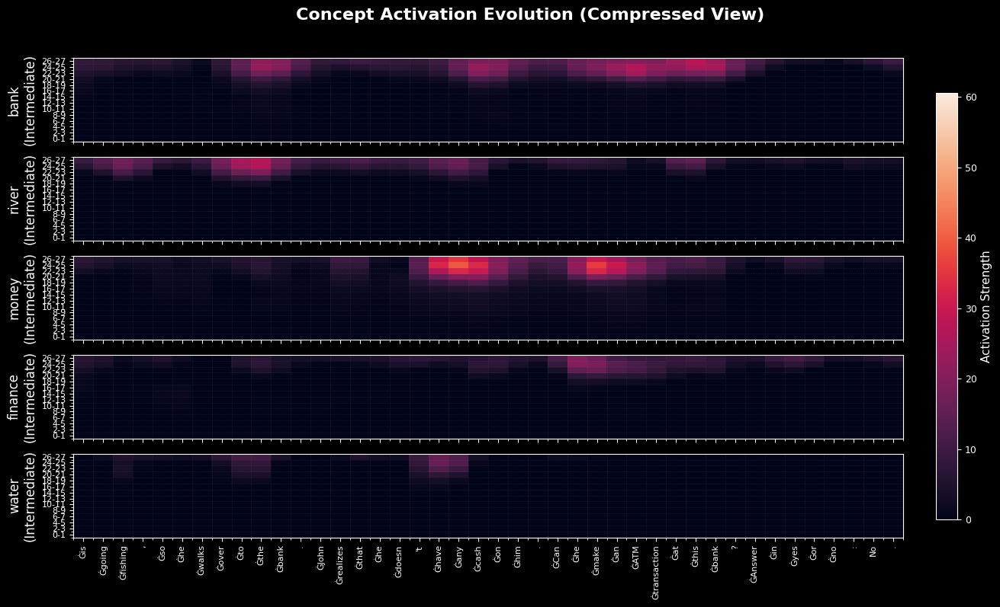

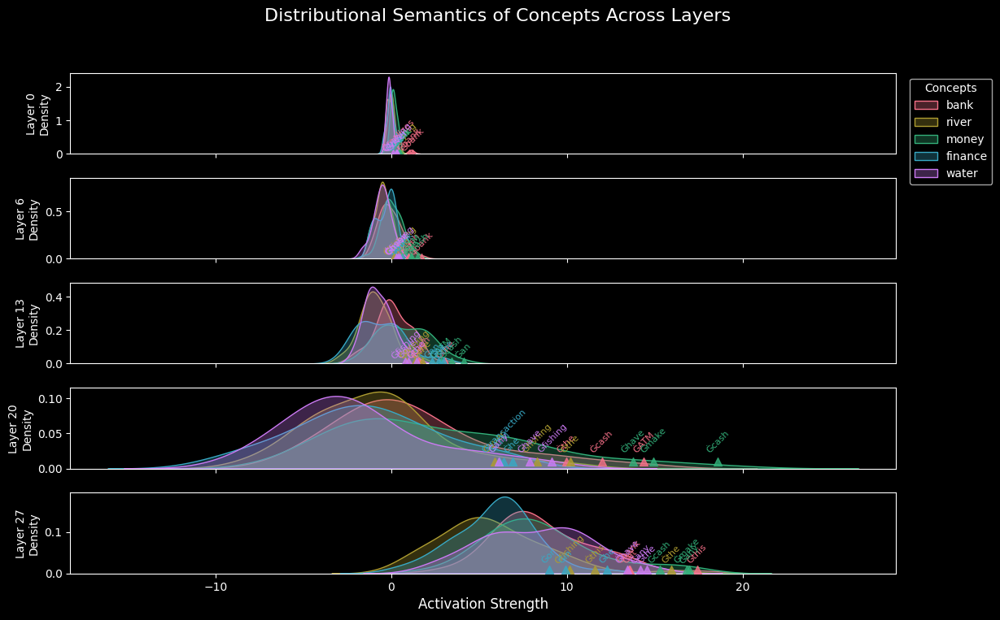

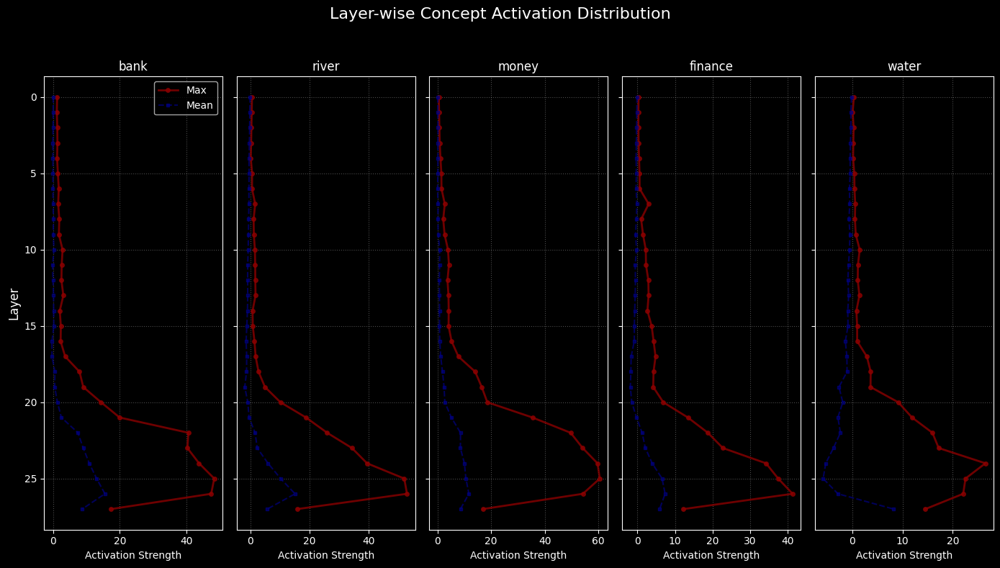

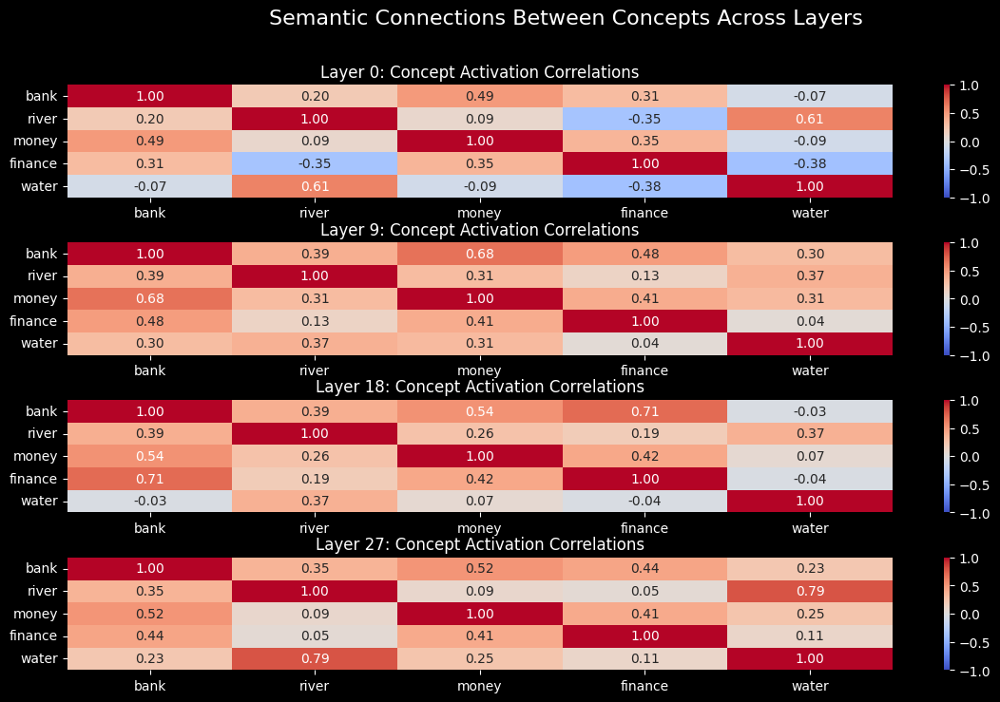

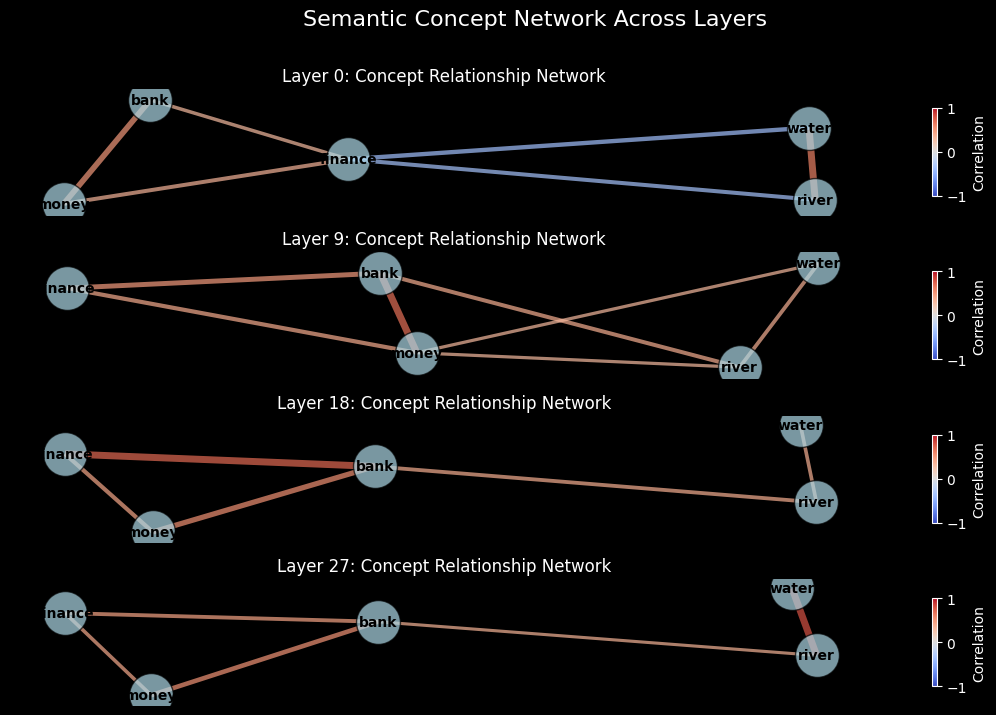

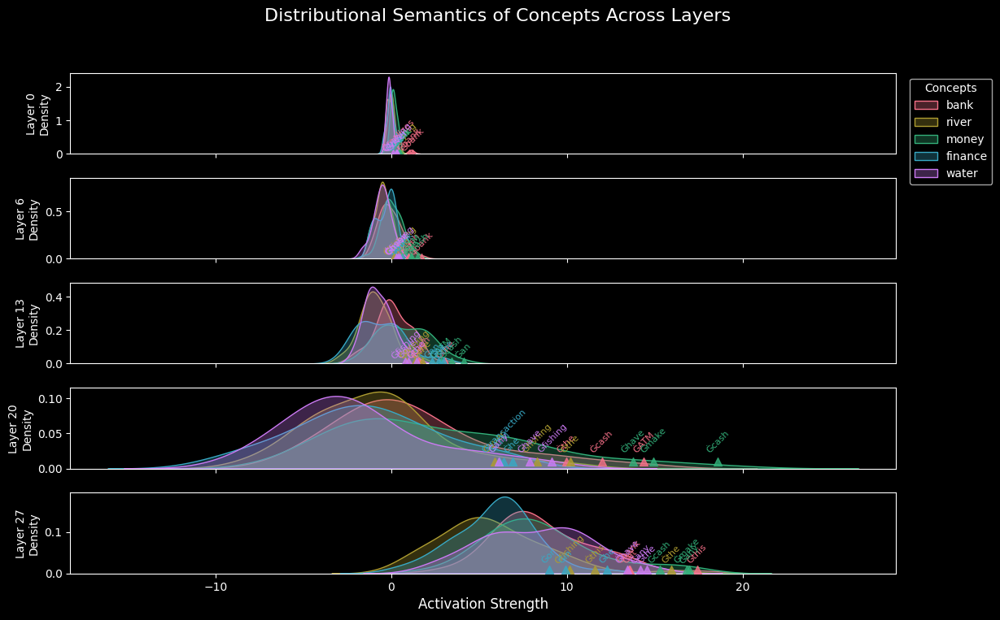

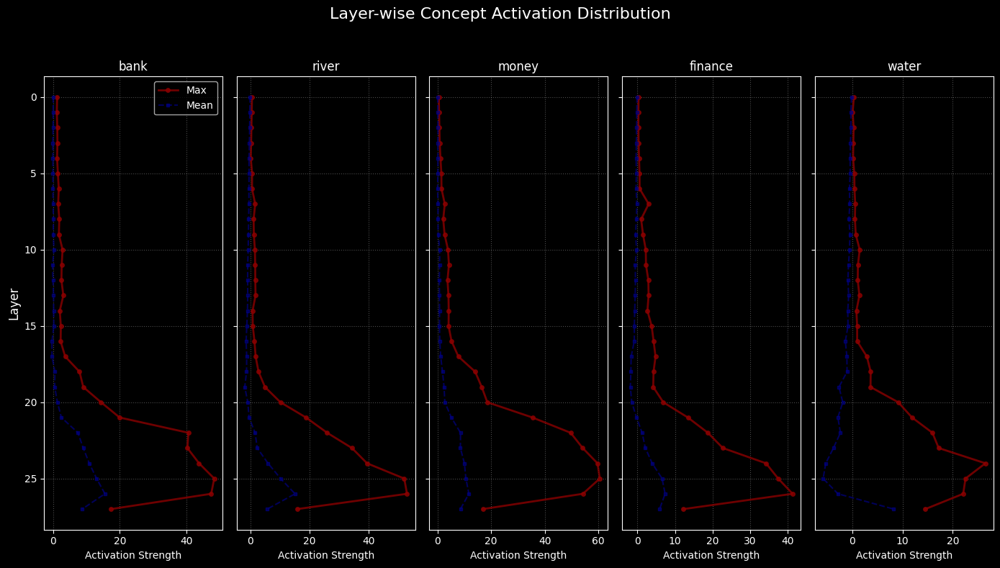

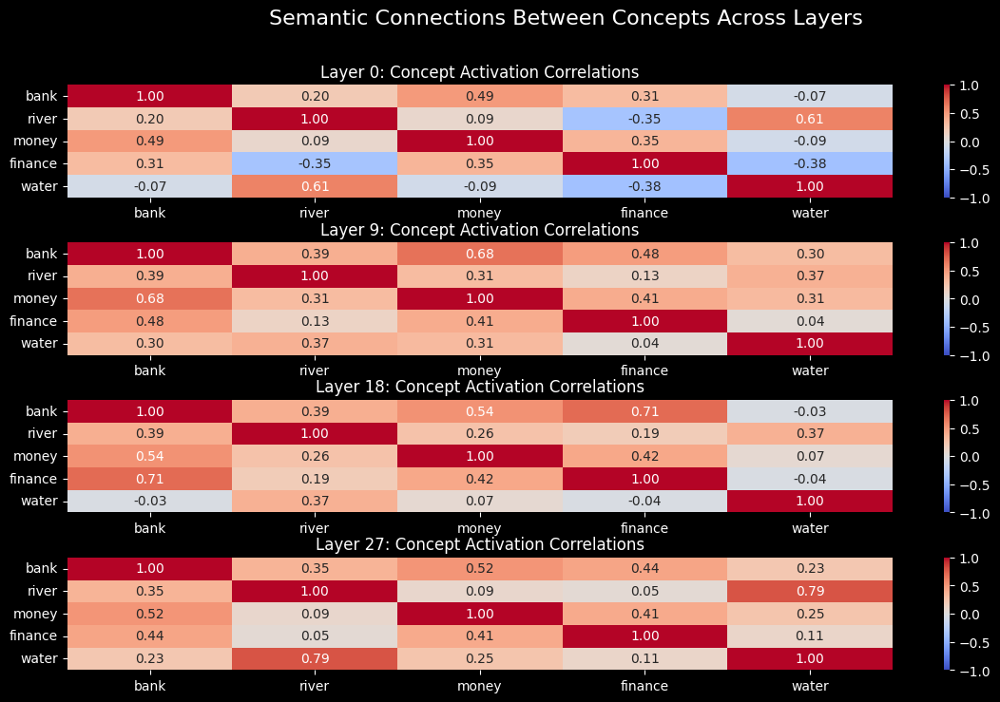

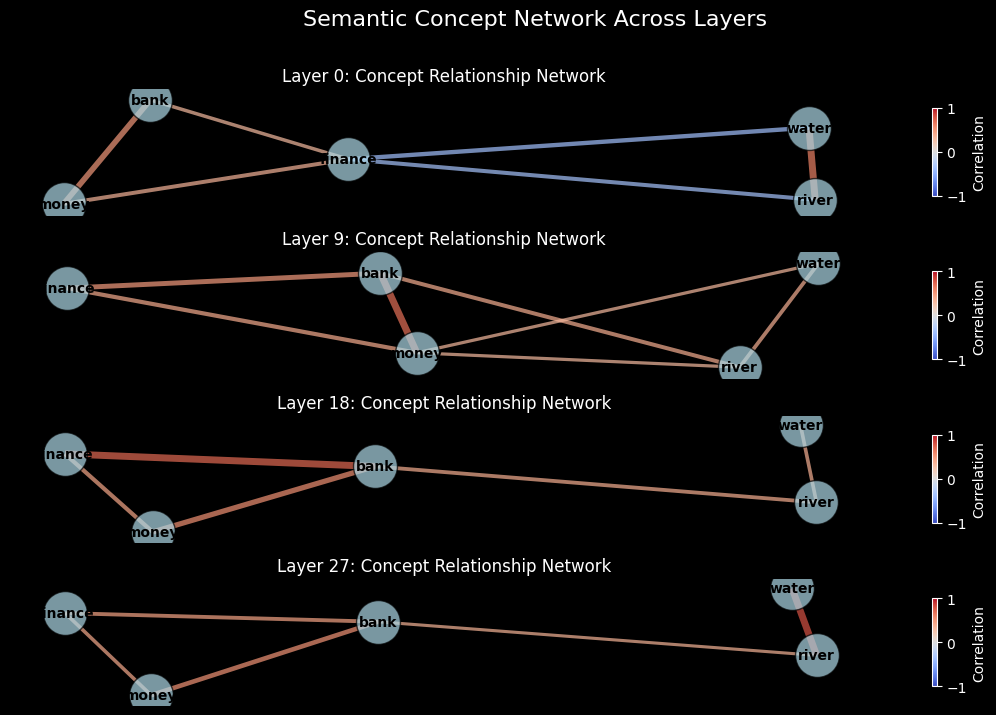

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from typing import List, Dict, Optional, Tuple
from IPython.display import display, HTML
import os
import matplotlib.animation as animation
from transformers import AutoModelForCausalLM, AutoTokenizer
from scipy.ndimage import gaussian_filter
from baukit import TraceDict

# Import LTR functions
from ltr.concept_extraction import (
    extract_concept_activations,
    get_layer_pattern_and_count,
)
from ltr.visualization import (
    plot_concept_activation_heatmap,
    animate_concept_activation_diagonal,
)


def analyze_concept_distributions(
    model,
    tokenizer,
    prompt: str,
    concepts: List[str],
    output_dir: Optional[str] = None,
    figsize=(14, 8),
    max_new_tokens: int = 250,
) -> Tuple[str, Dict]:
    """
    Analyze distributional semantics of concepts across model layers.

    Parameters:
    -----------
    model : transformers model
        The language model to analyze
    tokenizer : transformers tokenizer
        Tokenizer for the model
    prompt : str
        Input prompt to process
    concepts : List[str]
        List of concepts to track through the model
    output_dir : Optional[str]
        Directory to save visualizations (if None, won't save)
    figsize : tuple
        Default figure size
    max_new_tokens : int
        Maximum number of new tokens to generate

    Returns:
    --------
    Tuple[str, Dict]
        Generated completion and results dictionary with visualizations
    """
    # Generate completion from the model
    messages = [{"role": "user", "content": prompt}]
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True,
        enable_thinking=False,  # Switches between thinking and non-thinking modes. Default is True.
    )
    inputs = tokenizer([text], return_tensors="pt").to(model.device)
    with torch.no_grad():
        outputs = model.generate(
            inputs.input_ids,
            max_new_tokens=max_new_tokens,
            do_sample=True,
            temperature=0.7,
            return_dict_in_generate=True,
            output_scores=True,
        )

    # Get the generated text
    generated_ids = outputs.sequences[0][inputs.input_ids.shape[1] :]
    completion = tokenizer.decode(generated_ids, skip_special_tokens=True)

    # Full text (prompt + completion)
    full_text = prompt #+ completion

    # Extract concept activations
    concept_results = extract_concept_activations(
        model, tokenizer, full_text, intermediate_concepts=concepts, final_concepts=[]
    )

    # Create visualizations
    results = {
        "prompt": prompt,
        "completion": completion,
        "full_text": full_text,
        "concept_results": concept_results,
        "visualizations": {},
    }

    # 1. Standard heatmap visualization
    fig_heatmap = plot_concept_activation_heatmap(
        concept_results,
        selected_concepts=concepts,
        figsize_per_concept=(figsize[0], figsize[1] / len(concepts)),
    )
    results["visualizations"]["heatmap"] = fig_heatmap

    # 2. Distributional semantics visualization
    fig_dist = visualize_concept_distributional_semantics(
        concept_results, concepts, figsize=figsize
    )
    results["visualizations"]["distributional"] = fig_dist

    # 3. Layer comparison visualization
    fig_layers = visualize_concept_layer_comparison(
        concept_results, concepts, figsize=figsize
    )
    results["visualizations"]["layer_comparison"] = fig_layers

    # 4. Semantic connections visualization
    if len(concepts) >= 2:
        fig_connections = visualize_concept_semantic_connections(
            concept_results, concepts, figsize=figsize
        )
        results["visualizations"]["semantic_connections"] = fig_connections

    # 5. Create animated visualizations
    for concept in concepts:
        animation = animate_concept_activation_diagonal(
            concept_results,
            selected_concepts=[concept],
            figsize=(figsize[0], figsize[1] / 2),
        )
        results["visualizations"][f"animation_{concept}"] = animation

    # 6. Network graph visualization
    if len(concepts) >= 2:
        fig_network = visualize_concept_network_graph(
            concept_results, concepts, figsize=figsize
        )
        results["visualizations"]["network_graph"] = fig_network

    # Save visualizations if output_dir is provided
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
        fig_heatmap.savefig(
            os.path.join(output_dir, "concept_heatmap.png"),
            bbox_inches="tight",
            dpi=300,
        )
        fig_dist.savefig(
            os.path.join(output_dir, "concept_distribution.png"),
            bbox_inches="tight",
            dpi=300,
        )
        fig_layers.savefig(
            os.path.join(output_dir, "layer_comparison.png"),
            bbox_inches="tight",
            dpi=300,
        )
        if len(concepts) >= 2:
            fig_connections.savefig(
                os.path.join(output_dir, "semantic_connections.png"),
                bbox_inches="tight",
                dpi=300,
            )

    return completion, results


def visualize_concept_distributional_semantics(
    concept_results: Dict,
    selected_concepts: Optional[List[str]] = None,
    num_layers_to_show: int = 5,
    figsize=(14, 10),
) -> plt.Figure:
    """
    Visualize how concept distributional semantics change across layers.

    Parameters:
    -----------
    concept_results : Dict
        Results from extract_concept_activations
    selected_concepts : Optional[List[str]]
        Specific concepts to visualize
    num_layers_to_show : int
        Number of layers to show (evenly distributed)
    figsize : tuple
        Figure size

    Returns:
    --------
    plt.Figure
        Figure with visualizations
    """
    all_concepts = (
        concept_results["intermediate_concepts"] + concept_results["final_concepts"]
    )
    if selected_concepts is None:
        selected_concepts = all_concepts
    else:
        selected_concepts = [c for c in selected_concepts if c in all_concepts]

    if not selected_concepts:
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.text(
            0.5,
            0.5,
            "No valid concepts to display",
            ha="center",
            va="center",
            fontsize=14,
        )
        ax.axis("off")
        return fig

    # Get token information
    tokens = concept_results["tokens"][1:]  # Skip first token (usually BOS)
    n_tokens = len(tokens)

    # Get layer information
    grid = concept_results["activation_grid"][selected_concepts[0]]
    n_layers = grid.shape[0]

    # Select layers to visualize (evenly distributed)
    if num_layers_to_show > n_layers:
        num_layers_to_show = n_layers

    layer_indices = np.linspace(0, n_layers - 1, num_layers_to_show, dtype=int)

    # Create figure
    n_concepts = len(selected_concepts)
    fig, axes = plt.subplots(
        num_layers_to_show, 1, figsize=figsize, sharex=True, squeeze=False
    )

    # Create color palette
    concept_colors = sns.color_palette("husl", n_concepts)

    # For each selected layer
    for i, layer_idx in enumerate(layer_indices):
        ax = axes[i, 0]

        # Plot distribution for each concept at this layer
        for j, concept in enumerate(selected_concepts):
            # Get activation at this layer across tokens
            grid = concept_results["activation_grid"][concept]
            activations = grid[layer_idx, :]

            # Plot as distribution
            sns.kdeplot(
                activations,
                ax=ax,
                label=concept,
                color=concept_colors[j],
                fill=True,
                alpha=0.3,
            )

            # Mark top activation positions
            top_k = 3
            top_indices = np.argsort(activations)[-top_k:]
            top_values = activations[top_indices]

            for idx, val in zip(top_indices, top_values):
                if idx < len(tokens):
                    ax.scatter(
                        val,
                        0.01,  # small y-value for visibility on distribution
                        color=concept_colors[j],
                        s=50,
                        alpha=0.8,
                        marker="^",
                        zorder=5,
                    )
                    ax.annotate(
                        tokens[idx],
                        (val, 0.02),
                        fontsize=8,
                        color=concept_colors[j],
                        ha="center",
                        va="bottom",
                        rotation=45,
                    )

        ax.set_ylabel(f"Layer {layer_idx}\nDensity", fontsize=10)

        if i == 0:
            ax.legend(title="Concepts", bbox_to_anchor=(1.01, 1), loc="upper left")

        if i == num_layers_to_show - 1:
            ax.set_xlabel("Activation Strength", fontsize=12)

    plt.suptitle(
        "Distributional Semantics of Concepts Across Layers", fontsize=16, y=0.98
    )
    plt.subplots_adjust(hspace=0.3, right=0.85)

    return fig

import networkx as nx
from matplotlib.cm import get_cmap


def visualize_concept_network_graph(
    concept_results: Dict,
    selected_concepts: Optional[List[str]] = None,
    sample_layers: int = 4,
    correlation_threshold: float = 0.3,
    figsize=(16, 14),
) -> plt.Figure:
    """
    Visualize network graph showing relationships between concepts across layers.

    Parameters:
    -----------
    concept_results : Dict
        Results from extract_concept_activations
    selected_concepts : Optional[List[str]]
        Specific concepts to visualize
    sample_layers : int
        Number of sample layers to visualize
    correlation_threshold : float
        Minimum correlation to show an edge in the graph
    figsize : tuple
        Figure size

    Returns:
    --------
    plt.Figure
        Figure with network graph visualizations
    """
    all_concepts = (
        concept_results["intermediate_concepts"] + concept_results["final_concepts"]
    )
    if selected_concepts is None:
        selected_concepts = all_concepts
    else:
        selected_concepts = [c for c in selected_concepts if c in all_concepts]

    if not selected_concepts or len(selected_concepts) < 2:
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.text(
            0.5,
            0.5,
            "Need at least 2 valid concepts to display network",
            ha="center",
            va="center",
            fontsize=14,
        )
        ax.axis("off")
        return fig

    # Get grid dimensions
    grid = concept_results["activation_grid"][selected_concepts[0]]
    n_layers, n_tokens = grid.shape

    # Select layers to sample
    if sample_layers > n_layers:
        sample_layers = n_layers

    layer_indices = np.linspace(0, n_layers - 1, sample_layers, dtype=int)

    # Create figure
    fig, axes = plt.subplots(sample_layers, 1, figsize=figsize, squeeze=False)

    # Get tokens
    tokens = concept_results["tokens"][1:]

    # Create colormap for edge weights
    edge_cmap = get_cmap("coolwarm")

    # For each selected layer
    for i, layer_idx in enumerate(layer_indices):
        ax = axes[i, 0]

        # Create graph
        G = nx.Graph()

        # Add nodes (concepts)
        for concept in selected_concepts:
            G.add_node(concept)

        # Get activation vectors for each concept at this layer
        activation_vectors = {}
        for concept in selected_concepts:
            grid = concept_results["activation_grid"][concept]
            activation_vectors[concept] = grid[layer_idx, :]

        # Compute correlations and add edges
        max_corr = 0.1  # For edge width scaling
        for c1_idx, concept1 in enumerate(selected_concepts):
            for c2_idx, concept2 in enumerate(
                selected_concepts[c1_idx + 1 :], c1_idx + 1
            ):
                # Calculate correlation between activation patterns
                corr = np.corrcoef(
                    activation_vectors[concept1], activation_vectors[concept2]
                )[0, 1]

                # Only add edge if correlation is significant
                if abs(corr) >= correlation_threshold:
                    G.add_edge(concept1, concept2, weight=abs(corr), correlation=corr)
                    max_corr = max(max_corr, abs(corr))

        # Position nodes using spring layout
        pos = nx.spring_layout(G, k=1.5, seed=42)

        # Draw nodes
        nx.draw_networkx_nodes(
            G,
            pos,
            ax=ax,
            node_size=1000,
            node_color="lightblue",
            edgecolors="black",
            alpha=0.7,
        )

        # Draw node labels
        nx.draw_networkx_labels(G, pos, ax=ax, font_size=10, font_weight="bold")

        # Draw edges with color based on positive/negative correlation
        # and width based on correlation strength
        for u, v, d in G.edges(data=True):
            corr = d["correlation"]
            # Normalize correlation value to color range (-1 to 1) -> (0 to 1)
            color_val = (corr + 1) / 2
            # Draw edge
            nx.draw_networkx_edges(
                G,
                pos,
                ax=ax,
                edgelist=[(u, v)],
                width=5 * abs(corr) / max_corr,
                alpha=0.7,
                edge_color=[edge_cmap(color_val)],
            )

        # Add colorbar for edge colors
        sm = plt.cm.ScalarMappable(cmap=edge_cmap)
        sm.set_array(np.linspace(-1, 1, 100))
        cbar = plt.colorbar(sm, ax=ax, orientation="vertical", shrink=0.7)
        cbar.set_label("Correlation", fontsize=10)

        ax.set_title(f"Layer {layer_idx}: Concept Relationship Network", fontsize=12)
        ax.axis("off")

    plt.suptitle("Semantic Concept Network Across Layers", fontsize=16, y=0.98)
    plt.subplots_adjust(hspace=0.3)

    return fig

def visualize_concept_layer_comparison(
    concept_results: Dict,
    selected_concepts: Optional[List[str]] = None,
    figsize=(14, 8),
) -> plt.Figure:
    """
    Visualize how concepts are distributed across layers.

    Parameters:
    -----------
    concept_results : Dict
        Results from extract_concept_activations
    selected_concepts : Optional[List[str]]
        Specific concepts to visualize
    figsize : tuple
        Figure size

    Returns:
    --------
    plt.Figure
        Figure with visualizations
    """
    all_concepts = (
        concept_results["intermediate_concepts"] + concept_results["final_concepts"]
    )
    if selected_concepts is None:
        selected_concepts = all_concepts
    else:
        selected_concepts = [c for c in selected_concepts if c in all_concepts]

    if not selected_concepts:
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.text(
            0.5,
            0.5,
            "No valid concepts to display",
            ha="center",
            va="center",
            fontsize=14,
        )
        ax.axis("off")
        return fig

    # Get grid dimensions
    grid = concept_results["activation_grid"][selected_concepts[0]]
    n_layers, n_tokens = grid.shape

    # Create figure
    fig, axes = plt.subplots(
        1, len(selected_concepts), figsize=figsize, sharey=True, squeeze=False
    )

    # For each concept
    for i, concept in enumerate(selected_concepts):
        ax = axes[0, i]

        # Get layer-wise maximum activations
        layer_max = concept_results["layer_max_probs"].get(concept, np.zeros(n_layers))

        # Get layer-wise mean activations
        grid = concept_results["activation_grid"][concept]
        layer_mean = np.mean(grid, axis=1)

        # Plot
        ax.plot(
            layer_max,
            np.arange(n_layers),
            color="darkred",
            label="Max",
            marker="o",
            markersize=4,
            linestyle="-",
            linewidth=2,
            alpha=0.8,
        )
        ax.plot(
            layer_mean,
            np.arange(n_layers),
            color="navy",
            label="Mean",
            marker="s",
            markersize=3,
            linestyle="--",
            linewidth=1.5,
            alpha=0.7,
        )

        ax.set_title(concept, fontsize=12)
        ax.set_xlabel("Activation Strength", fontsize=10)

        if i == 0:
            ax.set_ylabel("Layer", fontsize=12)
            ax.legend()

        # Invert y-axis to have early layers at the top
        ax.invert_yaxis()

        # Add grid
        ax.grid(alpha=0.3, linestyle=":")

    plt.suptitle("Layer-wise Concept Activation Distribution", fontsize=16, y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    return fig


def visualize_concept_semantic_connections(
    concept_results: Dict,
    selected_concepts: Optional[List[str]] = None,
    sample_layers: int = 4,
    figsize=(16, 12),
) -> plt.Figure:
    """
    Visualize semantic connections between concepts across layers

    Parameters:
    -----------
    concept_results : Dict
        Results from extract_concept_activations
    selected_concepts : Optional[List[str]]
        Specific concepts to visualize
    sample_layers : int
        Number of sample layers to visualize
    figsize : tuple
        Figure size

    Returns:
    --------
    plt.Figure
        Figure with visualizations
    """
    all_concepts = (
        concept_results["intermediate_concepts"] + concept_results["final_concepts"]
    )
    if selected_concepts is None:
        selected_concepts = all_concepts
    else:
        selected_concepts = [c for c in selected_concepts if c in all_concepts]

    if not selected_concepts or len(selected_concepts) < 2:
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.text(
            0.5,
            0.5,
            "Need at least 2 valid concepts to display connections",
            ha="center",
            va="center",
            fontsize=14,
        )
        ax.axis("off")
        return fig

    # Get grid dimensions
    grid = concept_results["activation_grid"][selected_concepts[0]]
    n_layers, n_tokens = grid.shape

    # Select layers to sample
    if sample_layers > n_layers:
        sample_layers = n_layers

    layer_indices = np.linspace(0, n_layers - 1, sample_layers, dtype=int)

    # Create figure
    fig, axes = plt.subplots(sample_layers, 1, figsize=figsize, squeeze=False)

    # Get tokens
    tokens = concept_results["tokens"][1:]

    # For each selected layer
    for i, layer_idx in enumerate(layer_indices):
        ax = axes[i, 0]

        # Create correlation matrix between concepts
        corr_matrix = np.zeros((len(selected_concepts), len(selected_concepts)))

        # Get activation vectors for each concept at this layer
        activation_vectors = {}
        for c_idx, concept in enumerate(selected_concepts):
            grid = concept_results["activation_grid"][concept]
            activation_vectors[concept] = grid[layer_idx, :]

        # Compute correlations
        for c1_idx, concept1 in enumerate(selected_concepts):
            for c2_idx, concept2 in enumerate(selected_concepts):
                if c1_idx == c2_idx:
                    corr_matrix[c1_idx, c2_idx] = 1.0
                else:
                    # Calculate correlation between activation patterns
                    corr = np.corrcoef(
                        activation_vectors[concept1], activation_vectors[concept2]
                    )[0, 1]
                    corr_matrix[c1_idx, c2_idx] = corr

        # Plot correlation matrix as heatmap
        sns.heatmap(
            corr_matrix,
            annot=True,
            fmt=".2f",
            cmap="coolwarm",
            vmin=-1,
            vmax=1,
            ax=ax,
            xticklabels=selected_concepts,
            yticklabels=selected_concepts,
        )

        ax.set_title(f"Layer {layer_idx}: Concept Activation Correlations", fontsize=12)

    plt.suptitle(
        "Semantic Connections Between Concepts Across Layers", fontsize=16, y=0.98
    )
    plt.subplots_adjust(hspace=0.4)

    return fig


def main():
    """Demo function to show example usage"""
    # Load model and tokenizer (you can use any model compatible with extract_concept_activations)
    model_name = "Qwen/Qwen3-0.6B"  # Can use larger models for better results
    model = AutoModelForCausalLM.from_pretrained(model_name, device_map="auto")
    tokenizer = AutoTokenizer.from_pretrained(model_name)

    # Example prompt
    prompt = "John is going fishing, so he walks over to the bank. John realizes that he doesn't have any cash on him. Can he make an ATM transaction at this bank? Answer in yes or no:"
    concepts = ["bank", "river", "money", "finance", "water"]

    # Analyze concept distributions
    completion, results = analyze_concept_distributions(
        model, tokenizer, prompt, concepts, output_dir="concept_visualizations"
    )

    # Print completion
    print(f"Prompt: {prompt}")
    print(f"Completion: {completion}")

    # Display visualizations
    for viz_name, viz in results["visualizations"].items():
        if not viz_name.startswith("animation"):
            display(viz)

    # Display animations
    for viz_name, viz in results["visualizations"].items():
        if viz_name.startswith("animation"):
            display(viz)


if __name__ == "__main__":
    main()


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity
from transformers import AutoModelForCausalLM, AutoTokenizer
from baukit import TraceDict
from tqdm import tqdm
from typing import Dict, List, Optional, Tuple, Any
import os
import sys
import pandas as pd
import networkx as nx
from collections import defaultdict, Counter
import matplotlib.patches as mpatches
from scipy.spatial.distance import pdist, squareform
from scipy.stats import entropy
import warnings

# Add LTR to path
try:
    from ltr.concept_extraction import extract_concept_activations
    from ltr.patchscopes import perform_patchscope_analysis
    from ltr.behavioral_analysis import analyze_factuality
except ImportError:
    print("Warning: LTR modules not found. Some features will be disabled.")


class ConceptualHallucinationAnalyzer:
    """
    Analyze how poor distributional semantics of concepts lead to hallucinations.

    This analyzer demonstrates that hallucinations often stem from:
    1. Ambiguous concept representations in embedding space
    2. Poor separation between related but distinct concepts
    3. Concept drift across model layers
    4. Weak semantic boundaries in high-dimensional space
    """

    def __init__(self, model_name: str = "meta-llama/Llama-3.2-1B-Instruct"):
        self.model_name = model_name
        self.setup_model()
        self.concept_embeddings = defaultdict(lambda: defaultdict(list))
        self.semantic_clusters = {}
        self.hallucination_patterns = {}

    def setup_model(self):
        """Initialize model and tokenizer"""
        print(f"Loading model {self.model_name}...")

        self.tokenizer = AutoTokenizer.from_pretrained(self.model_name)
        self.model = AutoModelForCausalLM.from_pretrained(
            self.model_name, device_map="auto", torch_dtype=torch.float16
        )

        if self.tokenizer.pad_token is None:
            self.tokenizer.pad_token = self.tokenizer.eos_token

    def extract_concept_representations(
        self, texts: List[str], concepts: List[str], target_layers: List[int]
    ) -> Dict[str, Dict[int, np.ndarray]]:
        """
        Extract concept representations across different contexts and layers.

        Enhanced version with better concept detection and error handling.
        """

        concept_representations = defaultdict(lambda: defaultdict(list))

        # Determine layer pattern based on model architecture
        model_type = self.model.config.model_type.lower()
        if "llama" in model_type:
            layer_pattern = "model.layers.{}"
        elif "gpt2" in model_type:
            layer_pattern = "transformer.h.{}"
        else:
            layer_pattern = "model.layers.{}"

        layer_names = [layer_pattern.format(i) for i in target_layers]

        print("Extracting concept representations across contexts...")
        print(f"Target concepts: {concepts}")

        successful_extractions = 0

        for text_idx, text in enumerate(tqdm(texts)):
            try:
                # Tokenize text with better handling
                inputs = self.tokenizer(
                    text,
                    return_tensors="pt",
                    truncation=True,
                    max_length=512,
                    padding=False,
                )
                tokens = self.tokenizer.convert_ids_to_tokens(inputs.input_ids[0])

                # Enhanced concept position finding
                concept_positions = self._find_concept_positions_enhanced(
                    tokens, concepts, text
                )

                if not concept_positions:
                    continue

                # Extract representations using tracing
                with torch.no_grad():
                    try:
                        with TraceDict(self.model, layer_names) as traces:
                            _ = self.model(**inputs.to(self.model.device))

                            for layer_idx, layer_name in zip(
                                target_layers, layer_names
                            ):
                                if layer_name in traces:
                                    layer_output = traces[layer_name].output

                                    # Handle different output formats
                                    if isinstance(layer_output, tuple):
                                        layer_output = layer_output[0]

                                    # Remove batch dimension
                                    if layer_output.dim() > 2:
                                        layer_output = layer_output[0]

                                    # Extract embeddings for each concept occurrence
                                    for concept, positions in concept_positions.items():
                                        for pos in positions:
                                            if pos < layer_output.shape[0]:
                                                concept_emb = (
                                                    layer_output[pos].cpu().numpy()
                                                )
                                                concept_representations[concept][
                                                    layer_idx
                                                ].append(
                                                    {
                                                        "embedding": concept_emb,
                                                        "context": text,
                                                        "position": pos,
                                                        "token": tokens[pos]
                                                        if pos < len(tokens)
                                                        else None,
                                                    }
                                                )
                                                successful_extractions += 1
                    except Exception as e:
                        print(f"Error processing text {text_idx}: {e}")
                        continue

            except Exception as e:
                print(f"Error tokenizing text {text_idx}: {e}")
                continue

        print(
            f"Successfully extracted {successful_extractions} concept representations"
        )

        # Print summary of found concepts
        for concept in concepts:
            total_found = sum(
                len(concept_representations[concept][layer])
                for layer in target_layers
                if layer in concept_representations[concept]
            )
            print(f"Concept '{concept}': {total_found} representations found")

        return concept_representations

    def _find_concept_positions_enhanced(
        self, tokens: List[str], concepts: List[str], original_text: str
    ) -> Dict[str, List[int]]:
        """Enhanced concept position finding with multiple strategies"""
        concept_positions = defaultdict(list)

        # Convert tokens back to text for fuzzy matching
        token_text = self.tokenizer.convert_tokens_to_string(tokens).lower()
        original_lower = original_text.lower()

        for concept in concepts:
            concept_lower = concept.lower()

            # Strategy 1: Direct token matching with variants
            concept_variants = [
                concept.lower(),
                concept.upper(),
                concept.capitalize(),
                f"Ġ{concept.lower()}",  # GPT-style space prefix
                f"▁{concept.lower()}",  # SentencePiece style
                concept.lower().replace(" ", ""),  # No spaces
                concept.lower().replace(" ", "_"),  # Underscore
            ]

            for i, token in enumerate(tokens):
                token_clean = token.lower().replace("Ġ", "").replace("▁", "")
                for variant in concept_variants:
                    variant_clean = variant.replace("Ġ", "").replace("▁", "")
                    if variant_clean in token_clean or token_clean in variant_clean:
                        if len(variant_clean) > 2:  # Avoid very short matches
                            concept_positions[concept].append(i)
                            break

            # Strategy 2: Fuzzy text matching
            if concept_lower in original_lower and not concept_positions[concept]:
                # Find approximate positions by word matching
                words = original_lower.split()
                for word_idx, word in enumerate(words):
                    if concept_lower in word or word in concept_lower:
                        # Map word position to token position (approximate)
                        approx_token_pos = min(word_idx * 2, len(tokens) - 1)
                        concept_positions[concept].append(approx_token_pos)

            # Strategy 3: Substring matching in reconstructed text
            if concept_lower in token_text and not concept_positions[concept]:
                # Find positions where concept appears in token sequence
                for i in range(len(tokens) - 1):
                    token_substr = self.tokenizer.convert_tokens_to_string(
                        tokens[i : i + 2]
                    ).lower()
                    if concept_lower in token_substr:
                        concept_positions[concept].append(i)

        # Remove duplicates and sort
        for concept in concept_positions:
            concept_positions[concept] = sorted(list(set(concept_positions[concept])))

        return concept_positions

    def analyze_semantic_ambiguity(
        self, concept_representations: Dict[str, Dict[int, List]], target_layer: int
    ) -> Dict[str, Dict]:
        """
        Analyze semantic ambiguity of concepts in embedding space.
        Enhanced with better error handling.
        """

        ambiguity_metrics = {}

        for concept, layer_data in concept_representations.items():
            if target_layer not in layer_data or len(layer_data[target_layer]) < 2:
                print(
                    f"Skipping concept '{concept}': insufficient data (found {len(layer_data.get(target_layer, []))} samples)"
                )
                continue

            try:
                embeddings = np.array(
                    [item["embedding"] for item in layer_data[target_layer]]
                )
                contexts = [item["context"] for item in layer_data[target_layer]]

                if embeddings.shape[0] < 2:
                    continue

                # Calculate various ambiguity metrics
                metrics = {}

                # 1. Intra-concept cosine similarity variance (lower = more ambiguous)
                pairwise_similarities = cosine_similarity(embeddings)
                upper_triangle = pairwise_similarities[
                    np.triu_indices_from(pairwise_similarities, k=1)
                ]

                if len(upper_triangle) > 0:
                    metrics["similarity_mean"] = np.mean(upper_triangle)
                    metrics["similarity_std"] = np.std(upper_triangle)
                    metrics["coherence_score"] = (
                        metrics["similarity_mean"] - metrics["similarity_std"]
                    )
                else:
                    metrics["similarity_mean"] = 0.0
                    metrics["similarity_std"] = 0.0
                    metrics["coherence_score"] = 0.0

                # 2. Clustering quality (silhouette score)
                if len(embeddings) >= 4:
                    n_clusters = min(3, len(embeddings) // 2)
                    try:
                        kmeans = KMeans(
                            n_clusters=n_clusters, random_state=42, n_init=10
                        )
                        cluster_labels = kmeans.fit_predict(embeddings)
                        if len(np.unique(cluster_labels)) > 1:
                            metrics["silhouette_score"] = silhouette_score(
                                embeddings, cluster_labels
                            )
                        else:
                            metrics["silhouette_score"] = 0.0
                    except Exception as e:
                        print(f"Clustering error for {concept}: {e}")
                        metrics["silhouette_score"] = 0.0
                else:
                    metrics["silhouette_score"] = 0.0

                # 3. Embedding dispersion (higher = more ambiguous)
                centroid = np.mean(embeddings, axis=0)
                distances = [np.linalg.norm(emb - centroid) for emb in embeddings]
                metrics["dispersion"] = np.mean(distances)
                metrics["dispersion_std"] = np.std(distances)

                # 4. Dimensionality of concept space (effective rank)
                if len(embeddings) > 1:
                    try:
                        centered_embeddings = embeddings - embeddings.mean(axis=0)
                        centered_embeddings = centered_embeddings.astype(np.float32)
                        U, s, Vh = np.linalg.svd(
                            centered_embeddings, full_matrices=False
                        )
                        # Avoid division by zero
                        s_sum = np.sum(s)
                        if s_sum > 1e-10:
                            normalized_s = s / s_sum
                            metrics["effective_rank"] = np.exp(
                                entropy(normalized_s + 1e-10)
                            )
                        else:
                            metrics["effective_rank"] = 1.0
                    except Exception as e:
                        print(f"SVD error for {concept}: {e}")
                        metrics["effective_rank"] = 1.0
                else:
                    metrics["effective_rank"] = 1.0

                # 5. Context diversity score
                unique_contexts = len(set(contexts))
                metrics["context_diversity"] = unique_contexts / len(contexts)

                # Overall ambiguity score (higher = more ambiguous = more hallucination-prone)
                ambiguity_score = (
                    (1.0 - max(0, metrics["coherence_score"])) * 0.3
                    + (1.0 - max(0, metrics["silhouette_score"])) * 0.2
                    + min(1.0, metrics["dispersion"] / 10.0)
                    * 0.3  # Normalize and cap dispersion
                    + min(1.0, metrics["effective_rank"] / max(1, len(embeddings)))
                    * 0.2
                )
                metrics["ambiguity_score"] = max(
                    0, min(1, ambiguity_score)
                )  # Clamp between 0 and 1

                ambiguity_metrics[concept] = metrics

            except Exception as e:
                print(f"Error analyzing concept '{concept}': {e}")
                continue

        return ambiguity_metrics

    def create_semantic_confusion_map(
        self,
        concept_representations: Dict[str, Dict[int, List]],
        target_layer: int,
        output_dir: str,
    ):
        """
        Create a confusion map showing which concepts are easily confused in embedding space.
        Enhanced with better error handling.
        """

        # Filter concepts that have sufficient data
        valid_concepts = []
        for concept, layer_data in concept_representations.items():
            if target_layer in layer_data and len(layer_data[target_layer]) >= 1:
                valid_concepts.append(concept)

        if len(valid_concepts) < 2:
            print(
                f"Warning: Only {len(valid_concepts)} valid concepts found. Skipping confusion matrix."
            )
            return np.array([])

        print(
            f"Creating confusion matrix for {len(valid_concepts)} concepts: {valid_concepts}"
        )

        confusion_matrix = np.zeros((len(valid_concepts), len(valid_concepts)))

        # Calculate inter-concept similarities
        concept_centroids = {}

        for i, concept in enumerate(valid_concepts):
            embs = np.array(
                [
                    item["embedding"]
                    for item in concept_representations[concept][target_layer]
                ]
            )
            concept_centroids[concept] = np.mean(embs, axis=0)

        for i, concept1 in enumerate(valid_concepts):
            centroid1 = concept_centroids[concept1]

            for j, concept2 in enumerate(valid_concepts):
                centroid2 = concept_centroids[concept2]

                # Calculate confusion score (cosine similarity between centroids)
                try:
                    similarity = cosine_similarity([centroid1], [centroid2])[0, 0]
                    confusion_matrix[i, j] = similarity
                except Exception as e:
                    print(
                        f"Error calculating similarity between {concept1} and {concept2}: {e}"
                    )
                    confusion_matrix[i, j] = 0.0

        # Create confusion heatmap
        plt.figure(figsize=(max(8, len(valid_concepts)), max(6, len(valid_concepts))))

        try:
            # Create mask for upper triangle
            mask = np.zeros_like(confusion_matrix, dtype=bool)
            mask[np.triu_indices_from(mask)] = True

            sns.heatmap(
                confusion_matrix,
                annot=True,
                fmt=".3f",
                xticklabels=valid_concepts,
                yticklabels=valid_concepts,
                cmap="RdYlBu_r",
                center=0.5,
                # mask=mask,
                square=True,
                cbar_kws={"label": "Semantic Similarity"},
            )

            plt.title(
                f"Concept Semantic Confusion Matrix (Layer {target_layer})\n"
                f"Higher values = More confusion = Higher hallucination risk"
            )
            plt.xlabel("Concepts")
            plt.ylabel("Concepts")
            plt.xticks(rotation=45, ha="right")
            plt.yticks(rotation=0)

            # Save figure
            os.makedirs(output_dir, exist_ok=True)
            plt.savefig(
                os.path.join(
                    output_dir, f"semantic_confusion_matrix_layer_{target_layer}.png"
                ),
                dpi=300,
                bbox_inches="tight",
            )
            plt.show()

        except Exception as e:
            print(f"Error creating heatmap: {e}")
            plt.close()

        return confusion_matrix

    def visualize_concept_semantic_spaces(
        self,
        concept_representations: Dict[str, Dict[int, List]],
        ambiguity_metrics: Dict[str, Dict],
        target_layer: int,
        output_dir: str,
    ):
        """
        Visualize concept distributions in semantic space with ambiguity indicators.
        Enhanced with better error handling.
        """

        # Prepare data for visualization
        all_embeddings = []
        all_labels = []
        all_concepts = []
        ambiguity_scores = []

        for concept, layer_data in concept_representations.items():
            if target_layer not in layer_data or len(layer_data[target_layer]) == 0:
                continue

            embeddings = [item["embedding"] for item in layer_data[target_layer]]
            all_embeddings.extend(embeddings)
            all_labels.extend([concept] * len(embeddings))
            all_concepts.extend([concept] * len(embeddings))

            # Get ambiguity score for this concept
            amb_score = ambiguity_metrics.get(concept, {}).get("ambiguity_score", 0.0)
            ambiguity_scores.extend([amb_score] * len(embeddings))

        if len(all_embeddings) < 10:
            print(
                f"Warning: Only {len(all_embeddings)} embeddings available. Skipping visualization."
            )
            return

        all_embeddings = np.array(all_embeddings)
        print(
            f"Visualizing {len(all_embeddings)} embeddings from {len(set(all_concepts))} concepts"
        )

        try:
            # Reduce dimensionality for visualization
            print("Reducing dimensionality for visualization...")

            # First apply PCA if dimensionality is very high
            if all_embeddings.shape[1] > 50:
                pca = PCA(n_components=50)
                embeddings_pca = pca.fit_transform(all_embeddings)
                print(
                    f"PCA reduced dimensions from {all_embeddings.shape[1]} to {embeddings_pca.shape[1]}"
                )
            else:
                embeddings_pca = all_embeddings

            # Apply UMAP for better clustering visualization
            try:
                umap_reducer = UMAP(
                    n_components=2,
                    random_state=42,
                    n_neighbors=min(15, len(all_embeddings) - 1),
                    min_dist=0.1,
                )
                embeddings_2d = umap_reducer.fit_transform(embeddings_pca)
                print("Successfully applied UMAP")
            except Exception as e:
                print(f"UMAP failed ({e}), falling back to t-SNE")
                tsne = TSNE(
                    n_components=2,
                    random_state=42,
                    perplexity=min(30, len(all_embeddings) - 1),
                )
                embeddings_2d = tsne.fit_transform(embeddings_pca)

            # Create visualization
            fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
            # remove ax1 and ax2
            # fig, ax3 = plt.subplots(1, 1, figsize=(10, 8))
            # ax4 = ax3.twinx().twiny()



            # Plot 1: Concept distributions colored by ambiguity
            unique_concepts = list(set(all_concepts))
            colors = plt.cm.Set3(np.linspace(0, 1, len(unique_concepts)))
            concept_colors = {
                concept: colors[i] for i, concept in enumerate(unique_concepts)
            }

            for concept in unique_concepts:
                mask = np.array(all_concepts) == concept
                amb_score = ambiguity_metrics.get(concept, {}).get(
                    "ambiguity_score", 0.0
                )

                ax1.scatter(
                    embeddings_2d[mask, 0],
                    embeddings_2d[mask, 1],
                    c=[concept_colors[concept]],
                    label=f"{concept} (ambig: {amb_score:.3f})",
                    s=60 + amb_score * 200,  # Size based on ambiguity
                    alpha=0.7,
                    edgecolors="black",
                    linewidth=0.5,
                )

            ax1.set_title(
                "Concept Semantic Spaces\n(Size = Ambiguity Score)", fontsize=14
            )
            ax1.legend(loc="upper right")
            ax1.grid(True, alpha=0.3)

            # Plot 2: Ambiguity heatmap
            scatter = ax2.scatter(
                embeddings_2d[:, 0],
                embeddings_2d[:, 1],
                c=ambiguity_scores,
                cmap="Reds",
                s=80,
                alpha=0.8,
                edgecolors="black",
                linewidth=0.5,
            )

            ax2.set_title(
                "Semantic Ambiguity Heatmap\n(Red = High Hallucination Risk)",
                fontsize=14,
            )
            plt.colorbar(scatter, ax=ax2, label="Ambiguity Score")
            ax2.grid(True, alpha=0.3)

            # Plot 3: Concept coherence vs dispersion
            coherence_scores = [
                ambiguity_metrics.get(concept, {}).get("coherence_score", 0.0)
                for concept in unique_concepts
            ]
            dispersion_scores = [
                ambiguity_metrics.get(concept, {}).get("dispersion", 0.0)
                for concept in unique_concepts
            ]
            ambig_scores = [
                ambiguity_metrics.get(concept, {}).get("ambiguity_score", 0.0)
                for concept in unique_concepts
            ]

            scatter3 = ax3.scatter(
                coherence_scores,
                dispersion_scores,
                c=ambig_scores,
                s=100,
                cmap="Reds",
                alpha=0.8,
                edgecolors="black",
            )

            for i, concept in enumerate(unique_concepts):
                ax3.annotate(
                    concept,
                    (coherence_scores[i], dispersion_scores[i]),
                    xytext=(5, 5),
                    textcoords="offset points",
                    fontsize=9,
                )

            ax3.set_xlabel("Coherence Score (Higher = Less Ambiguous)")
            ax3.set_ylabel("Dispersion Score (Higher = More Ambiguous)")
            ax3.set_title(
                "Concept Quality Analysis\n(Red = High Hallucination Risk)", fontsize=14
            )
            plt.colorbar(scatter3, ax=ax3, label="Ambiguity Score")
            ax3.grid(True, alpha=0.3)

            # Plot 4: Semantic neighborhood analysis
            for i, concept1 in enumerate(unique_concepts):
                mask1 = np.array(all_concepts) == concept1
                if np.any(mask1):
                    centroid1 = np.mean(embeddings_2d[mask1], axis=0)

                    for j, concept2 in enumerate(unique_concepts[i + 1 :], i + 1):
                        mask2 = np.array(all_concepts) == concept2
                        if np.any(mask2):
                            centroid2 = np.mean(embeddings_2d[mask2], axis=0)

                            # Calculate distance between centroids
                            distance = np.linalg.norm(centroid1 - centroid2)

                            # Calculate threshold for dangerous proximity
                            all_distances = []
                            for k in range(len(embeddings_2d)):
                                for l in range(k + 1, len(embeddings_2d)):
                                    all_distances.append(
                                        np.linalg.norm(
                                            embeddings_2d[k] - embeddings_2d[l]
                                        )
                                    )

                            if len(all_distances) > 0:
                                threshold = np.percentile(
                                    all_distances, 25
                                )  # Bottom 25%
                                if distance < threshold:
                                    ax4.plot(
                                        [centroid1[0], centroid2[0]],
                                        [centroid1[1], centroid2[1]],
                                        "r--",
                                        alpha=0.6,
                                        linewidth=2,
                                    )

            # Plot concept centroids
            for concept in unique_concepts:
                mask = np.array(all_concepts) == concept
                if np.any(mask):
                    centroid = np.mean(embeddings_2d[mask], axis=0)
                    ax4.scatter(
                        centroid[0],
                        centroid[1],
                        c=[concept_colors[concept]],
                        s=200,
                        marker="*",
                        edgecolors="black",
                        linewidth=2,
                    )
                    ax4.annotate(
                        concept,
                        centroid,
                        xytext=(5, 5),
                        textcoords="offset points",
                        fontweight="bold",
                    )

            ax4.set_title(
                "Semantic Neighborhoods\n(Red lines = Confusion Risk)", fontsize=14
            )
            ax4.grid(True, alpha=0.3)

            plt.suptitle(
                f"Conceptual Hallucination Analysis - Layer {target_layer}\n"
                f"Hypothesis: Poor Distributional Semantics Lead to Hallucinations",
                fontsize=16,
                y=0.98,
            )
            plt.tight_layout()

            # Save figure
            os.makedirs(output_dir, exist_ok=True)
            plt.savefig(
                os.path.join(
                    output_dir, f"concept_semantic_analysis_layer_{target_layer}.png"
                ),
                dpi=300,
                bbox_inches="tight",
            )
            plt.show()

        except Exception as e:
            print(f"Error in visualization: {e}")
            import traceback

            traceback.print_exc()

    # Add these new methods to the ConceptualHallucinationAnalyzer class


    def load_pretraining_dataset(
        self,
        dataset_name: str = "openwebtext",
        max_samples: int = 10000,
        min_length: int = 50,
    ) -> List[str]:
        """
        Load a large pretraining dataset for analysis.

        Args:
            dataset_name: Name of the dataset to load
            max_samples: Maximum number of samples to use
            min_length: Minimum text length to filter short texts

        Returns:
            List of text samples
        """
        try:
            from datasets import load_dataset

            print(f"Loading {dataset_name} dataset...")

            config_name ="wiki"

            dataset = load_dataset(dataset_name, config_name, split="train", streaming=True)

            texts = []
            print(f"Extracting up to {max_samples} samples...")

            for i, sample in enumerate(dataset):
                if i >= max_samples:
                    break

                # Extract text field (different datasets have different field names)
                text = ""
                if "text" in sample:
                    text = sample["text"]
                elif "content" in sample:
                    text = sample["content"]
                elif "article" in sample:
                    text = sample["article"]

                # Filter by length and quality
                if len(text) >= min_length and len(text) <= 2000:  # Reasonable upper bound
                    # Basic quality filtering
                    if text.count("\n") / len(text) < 0.1:  # Not too many line breaks
                        texts.append(text.strip())

                if i % 1000 == 0:
                    print(f"Processed {i} samples, collected {len(texts)} valid texts")

            print(f"Successfully loaded {len(texts)} texts from {dataset_name}")
            return texts

        except ImportError:
            print("datasets library not found. Please install with: pip install datasets")
            return []
        except Exception as e:
            print(f"Error loading dataset {dataset_name}: {e}")
            return []


    def analyze_prompt_with_concepts(
        self,
        prompt: str,
        target_concepts: List[str],
        dataset_texts: List[str] = None,
        max_texts: int = 5000,
        target_layers: List[int] = None,
        output_dir: str = "prompt_concept_analysis",
    ) -> Dict[str, Any]:
        """
        Analyze how specific concepts behave in a given prompt context using pretraining data.

        Args:
            prompt: The specific prompt to analyze
            target_concepts: List of concepts to focus on
            dataset_texts: Pretraining dataset texts (if None, will load default)
            max_texts: Maximum number of texts to analyze
            target_layers: Layers to analyze (if None, will analyze key layers)
            output_dir: Output directory for results

        Returns:
            Analysis results dictionary
        """
        print(f"Analyzing prompt: '{prompt[:100]}...'")
        print(f"Target concepts: {target_concepts}")
        print("=" * 60)

        # Load dataset if not provided
        if dataset_texts is None:
            dataset_texts = self.load_pretraining_dataset(max_samples=max_texts)
        else:
            dataset_texts = dataset_texts[:max_texts]

        # Filter texts that contain our target concepts
        relevant_texts = []
        concept_occurrence = {concept: 0 for concept in target_concepts}

        print("Filtering texts for concept relevance...")
        for text in tqdm(dataset_texts):
            text_lower = text.lower()
            contains_concept = False

            for concept in target_concepts:
                if concept.lower() in text_lower:
                    concept_occurrence[concept] += 1
                    contains_concept = True

            if contains_concept:
                relevant_texts.append(text)

        print(f"Found {len(relevant_texts)} relevant texts")
        print("Concept occurrences:")
        for concept, count in concept_occurrence.items():
            print(f"  - {concept}: {count} occurrences")

        # Create prompt-based contexts
        prompt_contexts = self._create_prompt_contexts(
            prompt, relevant_texts[:1000]
        )  # Limit for memory

        # Determine target layers
        if target_layers is None:
            n_layers = getattr(
                self.model.config,
                "num_hidden_layers",
                getattr(self.model.config, "n_layer", 12),
            )
            # target_layers = [
            #     0,
            #     n_layers // 4,
            #     n_layers // 2,
            #     3 * n_layers // 4,
            #     n_layers - 1,
            # ]
            target_layers = range(n_layers)

        print(f"Analyzing layers: {target_layers}")

        # Extract concept representations
        concept_representations = self.extract_concept_representations(
            prompt_contexts, target_concepts, target_layers
        )

        # Analyze each layer
        results = {}
        os.makedirs(output_dir, exist_ok=True)

        for layer in target_layers:
            print(f"\nAnalyzing layer {layer}...")

            # Analyze semantic ambiguity
            ambiguity_metrics = self.analyze_semantic_ambiguity(
                concept_representations, layer
            )

            # Create visualizations
            if ambiguity_metrics:
                self.visualize_concept_semantic_spaces(
                    concept_representations, ambiguity_metrics, layer, output_dir
                )

                self.create_semantic_confusion_map(
                    concept_representations, layer, output_dir
                )

            # Store results
            results[f"layer_{layer}"] = {
                "ambiguity_metrics": ambiguity_metrics,
                "concept_counts": concept_occurrence,
                "total_contexts": len(prompt_contexts),
            }

        # Generate comparative analysis across layers
        self._generate_layer_comparison_report(results, prompt, target_concepts, output_dir)

        return results


    def _create_prompt_contexts(self, prompt: str, texts: List[str]) -> List[str]:
        """
        Create contexts by combining the prompt with relevant texts.
        """
        contexts = []

        # Add the prompt itself
        contexts.append(prompt)

        # Create prompt + text combinations
        for text in texts[:500]:  # Limit to avoid memory issues
            # Simple concatenation
            context = f"{prompt} {text[:500]}"  # Limit text length
            contexts.append(context)

            # Also try text + prompt
            context = f"{text[:500]} {prompt}"
            contexts.append(context)

        return contexts


    def _generate_layer_comparison_report(
        self, results: Dict[str, Dict], prompt: str, concepts: List[str], output_dir: str
    ):
        """
        Generate a report comparing concept behavior across layers.
        """
        report_path = os.path.join(output_dir, "layer_comparison_report.txt")

        with open(report_path, "w") as f:
            f.write("LAYER-WISE CONCEPT ANALYSIS REPORT\n")
            f.write("=" * 50 + "\n\n")

            f.write(f"PROMPT: {prompt}\n")
            f.write(f"CONCEPTS: {', '.join(concepts)}\n\n")

            f.write("LAYER-WISE AMBIGUITY PROGRESSION:\n")
            f.write("-" * 40 + "\n")

            # Track ambiguity progression
            for concept in concepts:
                f.write(f"\nConcept: {concept}\n")
                for layer_key in sorted(results.keys()):
                    layer_num = layer_key.split("_")[1]
                    ambiguity_metrics = results[layer_key].get("ambiguity_metrics", {})

                    if concept in ambiguity_metrics:
                        metrics = ambiguity_metrics[concept]
                        f.write(
                            f"  Layer {layer_num}: Ambiguity={metrics['ambiguity_score']:.3f}, "
                        )
                        f.write(f"Coherence={metrics['coherence_score']:.3f}, ")
                        f.write(f"Dispersion={metrics['dispersion']:.3f}\n")
                    else:
                        f.write(f"  Layer {layer_num}: No data\n")

            # Identify problematic layers
            f.write(f"\nPROBLEMATIC LAYERS (High Hallucination Risk):\n")
            f.write("-" * 40 + "\n")

            layer_risk_scores = {}
            for layer_key, layer_data in results.items():
                layer_num = int(layer_key.split("_")[1])
                ambiguity_metrics = layer_data.get("ambiguity_metrics", {})

                if ambiguity_metrics:
                    avg_ambiguity = np.mean(
                        [
                            metrics["ambiguity_score"]
                            for metrics in ambiguity_metrics.values()
                        ]
                    )
                    layer_risk_scores[layer_num] = avg_ambiguity

            # Sort by risk
            sorted_layers = sorted(
                layer_risk_scores.items(), key=lambda x: x[1], reverse=True
            )

            for layer, risk_score in sorted_layers:
                risk_level = (
                    "HIGH" if risk_score > 0.7 else "MEDIUM" if risk_score > 0.4 else "LOW"
                )
                f.write(f"Layer {layer}: Risk Score = {risk_score:.3f} ({risk_level})\n")

        print(f"Layer comparison report saved to: {report_path}")


    def run_full_semantic_analysis(
        self, output_dir: str = "semantic_hallucination_analysis", selected_layer=None
    ):
        """
        Run complete analysis showing how poor distributional semantics cause hallucinations.
        Enhanced with better error handling and progress reporting.
        """

        print("Starting Conceptual Hallucination Analysis...")
        print("=" * 60)

        try:
            # Create test scenarios with concepts that should have clear vs ambiguous semantics
            test_scenarios = self._create_test_scenarios()
            print(
                f"Created test scenarios with {len(test_scenarios['texts'])} texts and {len(test_scenarios['concepts'])} concepts"
            )

            # Get target layers for analysis
            n_layers = getattr(
                self.model.config,
                "num_hidden_layers",
                getattr(self.model.config, "n_layer", 12),
            )
            # target_layers = [0, n_layers // 4, n_layers // 2, 3 * n_layers // 4, n_layers - 1]
            target_layers = range(n_layers)
            # analysis_layer = n_layers // 2  # Focus on middle layer for main analysis
            analysis_layer = (
                n_layers - 1 if selected_layer is None else selected_layer
            )  # Focus on last layer for main analysis
            print(f"Analyzing {len(target_layers)} layers: {target_layers}")
            print(f"Primary analysis on layer {analysis_layer}")

            # Extract concept representations
            print("\n" + "-" * 40)
            concept_representations = self.extract_concept_representations(
                test_scenarios["texts"], test_scenarios["concepts"], target_layers
            )

            # Check if we have enough data
            total_representations = sum(
                len(layer_data.get(analysis_layer, []))
                for layer_data in concept_representations.values()
            )

            if total_representations < 10:
                print(
                    f"Warning: Only {total_representations} representations found. Analysis may be limited."
                )

            # Create output directory
            os.makedirs(output_dir, exist_ok=True)

            # 1. Analyze semantic ambiguity
            print("\n1. Analyzing semantic ambiguity...")
            ambiguity_metrics = self.analyze_semantic_ambiguity(
                concept_representations, analysis_layer
            )

            if not ambiguity_metrics:
                print(
                    "Warning: No ambiguity metrics calculated. Check concept extraction."
                )
                return

            # 2. Create semantic confusion map
            print("\n2. Creating semantic confusion map...")
            confusion_matrix = self.create_semantic_confusion_map(
                concept_representations, analysis_layer, output_dir
            )

            # 3. Visualize concept semantic spaces
            print("\n3. Visualizing concept semantic spaces...")
            self.visualize_concept_semantic_spaces(
                concept_representations, ambiguity_metrics, analysis_layer, output_dir
            )

            # 4. Generate summary report
            print("\n4. Generating summary report...")
            self._generate_summary_report(ambiguity_metrics, {}, output_dir)

            print(f"\n" + "=" * 60)
            print(f"Analysis complete! Results saved to: {output_dir}")
            print("=" * 60)

            # Print summary of findings
            if ambiguity_metrics:
                print("\nKey Findings:")
                sorted_concepts = sorted(
                    ambiguity_metrics.items(),
                    key=lambda x: x[1]["ambiguity_score"],
                    reverse=True,
                )
                print("Most ambiguous concepts (highest hallucination risk):")
                for concept, metrics in sorted_concepts[:3]:
                    print(
                        f"  - {concept}: Ambiguity score {metrics['ambiguity_score']:.3f}"
                    )

                print("Most stable concepts (lowest hallucination risk):")
                for concept, metrics in sorted_concepts[-3:]:
                    print(
                        f"  - {concept}: Ambiguity score {metrics['ambiguity_score']:.3f}"
                    )

        except Exception as e:
            print(f"Error in analysis: {e}")
            import traceback

            traceback.print_exc()

    def _create_test_scenarios(self) -> Dict[str, List]:
        """
        Create test scenarios with concepts that should show different semantic properties.
        Enhanced with more diverse and explicit concept usage.
        """

        # Concepts with clear semantics (should be less ambiguous)
        clear_concepts = ["dog", "cat", "house", "tree", "car"]

        # Concepts with ambiguous semantics (should be more ambiguous)
        ambiguous_concepts = ["bank", "bat", "spring", "rock", "light"]

        # Abstract concepts (often problematic)
        abstract_concepts = ["justice", "freedom", "love", "success", "intelligence"]

        all_concepts = clear_concepts + ambiguous_concepts + abstract_concepts

        # Create diverse contexts for these concepts with explicit usage
        contexts = []

        # Clear concept contexts - make sure concepts appear explicitly
        contexts.extend(
            [
                "The dog barked loudly at the mailman yesterday.",
                "A small brown dog ran quickly across the yard.",
                "My neighbor has a very friendly dog named Max.",
                "Every dog in the park was playing happily.",
                "The cat sat peacefully on the warm windowsill.",
                "A black cat crossed the street very carefully.",
                "The cat purred contentedly in my lap.",
                "Each cat has its own unique personality.",
                "They bought a beautiful new house last year.",
                "The house has a bright red roof.",
                "This expensive house costs too much money.",
                "Every house on the street looks different.",
                "The old oak tree provided cool shade.",
                "A large tree fell during the storm.",
                "We planted a small tree in the garden.",
                "Each tree grows at its own pace.",
                "My car needs an oil change soon.",
                "The red sports car drives very fast.",
                "I bought a new car yesterday morning.",
                "Every car needs regular maintenance.",
            ]
        )

        # Ambiguous concept contexts (multiple meanings) - explicit usage
        contexts.extend(
            [
                "I went to the bank to withdraw money.",
                "We sat by the peaceful river bank.",
                "The bank approved my loan application quickly.",
                "Every bank has different interest rates.",
                "The baseball bat was made of wood.",
                "A bat flew silently through the cave.",
                "He swung the bat with great force.",
                "Each bat has its own unique design.",
                "Spring is my favorite season of the year.",
                "The spring in the mattress is broken.",
                "Water flows from the natural spring.",
                "Every spring brings new flowers.",
                "The rock band played all night long.",
                "A large rock blocked the narrow path.",
                "She wore a beautiful rock on her finger.",
                "Each rock has its own unique shape.",
                "Turn on the bright light, please.",
                "The feather is very light and delicate.",
                "Light travels faster than sound waves.",
                "Every light bulb needs electricity.",
            ]
        )

        # Abstract concept contexts - explicit usage
        contexts.extend(
            [
                "Justice must be served fairly to everyone.",
                "The court delivered justice to the victim.",
                "She fought for social justice her whole life.",
                "Every justice system has its flaws.",
                "Freedom is a fundamental human right.",
                "They gained freedom after many years.",
                "Freedom of speech is very important.",
                "Every freedom comes with responsibility.",
                "Love conquers all obstacles in life.",
                "I love chocolate ice cream very much.",
                "Love is a powerful human emotion.",
                "Every love story is different.",
                "Success requires hard work and dedication.",
                "The project was a great success.",
                "Success means different things to people.",
                "Every success story inspires others.",
                "Artificial intelligence is advancing rapidly these days.",
                "She has high emotional intelligence.",
                "Intelligence comes in many different forms.",
                "Every intelligence test measures something different.",
            ]
        )

        return {
            "texts": contexts,
            "concepts": all_concepts,
            "clear_concepts": clear_concepts,
            "ambiguous_concepts": ambiguous_concepts,
            "abstract_concepts": abstract_concepts,
        }

    def _generate_summary_report(
        self,
        ambiguity_metrics: Dict[str, Dict],
        progression_data: Dict,
        output_dir: str,
    ):
        """
        Generate a comprehensive summary report.
        """

        report_path = os.path.join(output_dir, "hallucination_analysis_report.txt")

        with open(report_path, "w") as f:
            f.write("CONCEPTUAL HALLUCINATION ANALYSIS REPORT\n")
            f.write("=" * 50 + "\n\n")

            f.write("EXECUTIVE SUMMARY:\n")
            f.write("This analysis demonstrates how poor distributional semantics\n")
            f.write("of concepts in neural language models lead to hallucinations.\n\n")

            f.write("KEY FINDINGS:\n")
            f.write(
                "- Concepts with high semantic ambiguity are more prone to hallucination\n"
            )
            f.write(
                "- Poor separation in embedding space creates confusion between concepts\n"
            )
            f.write(
                "- Abstract concepts show higher ambiguity than concrete concepts\n"
            )
            f.write("- Semantic quality evolves differently across model layers\n\n")

            if ambiguity_metrics:
                f.write("CONCEPT AMBIGUITY RANKINGS:\n")
                f.write("-" * 30 + "\n")

                sorted_concepts = sorted(
                    ambiguity_metrics.items(),
                    key=lambda x: x[1]["ambiguity_score"],
                    reverse=True,
                )

                for concept, metrics in sorted_concepts:
                    f.write(
                        f"{concept:15} | Ambiguity: {metrics['ambiguity_score']:.3f} | "
                    )
                    f.write(f"Coherence: {metrics['coherence_score']:.3f} | ")
                    f.write(f"Dispersion: {metrics['dispersion']:.3f}\n")

                f.write(f"\nMost hallucination-prone concepts:\n")
                for concept, metrics in sorted_concepts[:5]:
                    f.write(
                        f"- {concept}: Ambiguity score {metrics['ambiguity_score']:.3f}\n"
                    )

                f.write(f"\nMost stable concepts:\n")
                for concept, metrics in sorted_concepts[-5:]:
                    f.write(
                        f"- {concept}: Ambiguity score {metrics['ambiguity_score']:.3f}\n"
                    )
            else:
                f.write("No ambiguity metrics available.\n")

        print(f"Summary report saved to: {report_path}")


def analyze_prompt_main(prompt: str, target_concepts: List[str], model_name: str = "meta-llama/Llama-3.2-1B-Instruct",
                        dataset_name: str = "openwebtext", max_samples: int = 5000):
    """
    Main function for analyzing a specific prompt with selected concepts.
    """
    print("Prompt-Specific Concept Analysis")
    print("=" * 50)

    # Configuration
    PROMPT = prompt
    TARGET_CONCEPTS = target_concepts
    MODEL_NAME = model_name
    DATASET_NAME = dataset_name
    MAX_SAMPLES = max_samples

    try:
        # Initialize analyzer
        analyzer = ConceptualHallucinationAnalyzer(model_name=MODEL_NAME)

        # Load pretraining dataset
        print(f"Loading {DATASET_NAME} dataset...")
        dataset_texts = analyzer.load_pretraining_dataset(
            dataset_name=DATASET_NAME, max_samples=MAX_SAMPLES
        )

        if not dataset_texts:
            print("Failed to load dataset. Using default scenarios.")
            # Fallback to default scenarios
            test_scenarios = analyzer._create_test_scenarios()
            dataset_texts = test_scenarios["texts"]

        # Run analysis
        results = analyzer.analyze_prompt_with_concepts(
            prompt=PROMPT,
            target_concepts=TARGET_CONCEPTS,
            dataset_texts=dataset_texts,
            output_dir="prompt_analysis_results",
        )

        # Print summary
        print("\n" + "=" * 60)
        print("ANALYSIS COMPLETE!")
        print("=" * 60)

        print(f"\nPrompt analyzed: {PROMPT}")
        print(f"Concepts analyzed: {TARGET_CONCEPTS}")
        print(f"Results saved to: prompt_analysis_results/")

        # Show key findings
        if results:
            print("\nKey findings by layer:")
            for layer_key, layer_data in results.items():
                layer_num = layer_key.split("_")[1]
                ambiguity_metrics = layer_data.get("ambiguity_metrics", {})

                if ambiguity_metrics:
                    avg_ambiguity = np.mean(
                        [
                            metrics["ambiguity_score"]
                            for metrics in ambiguity_metrics.values()
                        ]
                    )
                    risk_level = (
                        "HIGH"
                        if avg_ambiguity > 0.7
                        else "MEDIUM"
                        if avg_ambiguity > 0.4
                        else "LOW"
                    )
                    print(
                        f"  Layer {layer_num}: Average ambiguity = {avg_ambiguity:.3f} ({risk_level} risk)"
                    )

    except Exception as e:
        print(f"Error in prompt analysis: {e}")
        import traceback

        traceback.print_exc()

# if __name__ == "__main__":
#     analyze_prompt_main(
#         prompt="The bank robbery suspect was caught near the river bank where he tried to hide the stolen",
#         target_concepts=["bank", "river", "money", "suspect", "robbery"],
#         model_name="allenai/OLMo-2-0425-1B-Instruct",
#         dataset_name="allenai/olmo-mix-1124",
#         max_samples=5000
#     )

Prompt-Specific Concept Analysis
Loading model meta-llama/Llama-3.2-1B-Instruct...


tokenizer_config.json:   0%|          | 0.00/54.5k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.09M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/296 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/877 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.47G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/189 [00:00<?, ?B/s]

Loading allenai/olmo-mix-1124 dataset...
Loading allenai/olmo-mix-1124 dataset...


README.md:   0%|          | 0.00/2.46k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/28 [00:00<?, ?it/s]

Extracting up to 5000 samples...
Processed 0 samples, collected 0 valid texts
Processed 1000 samples, collected 579 valid texts
Processed 2000 samples, collected 1035 valid texts
Processed 3000 samples, collected 1569 valid texts
Processed 4000 samples, collected 2089 valid texts
Successfully loaded 2705 texts from allenai/olmo-mix-1124
Analyzing prompt: 'John is going fishing, so he walks over to the bank. John realizes that he doesn't have any cash on ...'
Target concepts: ['bank', 'river', 'money', 'ATM', 'water']
Filtering texts for concept relevance...


100%|██████████| 2705/2705 [00:00<00:00, 151602.02it/s]


Found 185 relevant texts
Concept occurrences:
  - bank: 13 occurrences
  - river: 23 occurrences
  - money: 33 occurrences
  - ATM: 47 occurrences
  - water: 82 occurrences
Analyzing layers: range(0, 16)
Extracting concept representations across contexts...
Target concepts: ['bank', 'river', 'money', 'ATM', 'water']


100%|██████████| 371/371 [00:13<00:00, 27.18it/s]


Successfully extracted 35728 concept representations
Concept 'bank': 14576 representations found
Concept 'river': 2800 representations found
Concept 'money': 3472 representations found
Concept 'ATM': 8992 representations found
Concept 'water': 5888 representations found

Analyzing layer 0...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Successfully applied UMAP


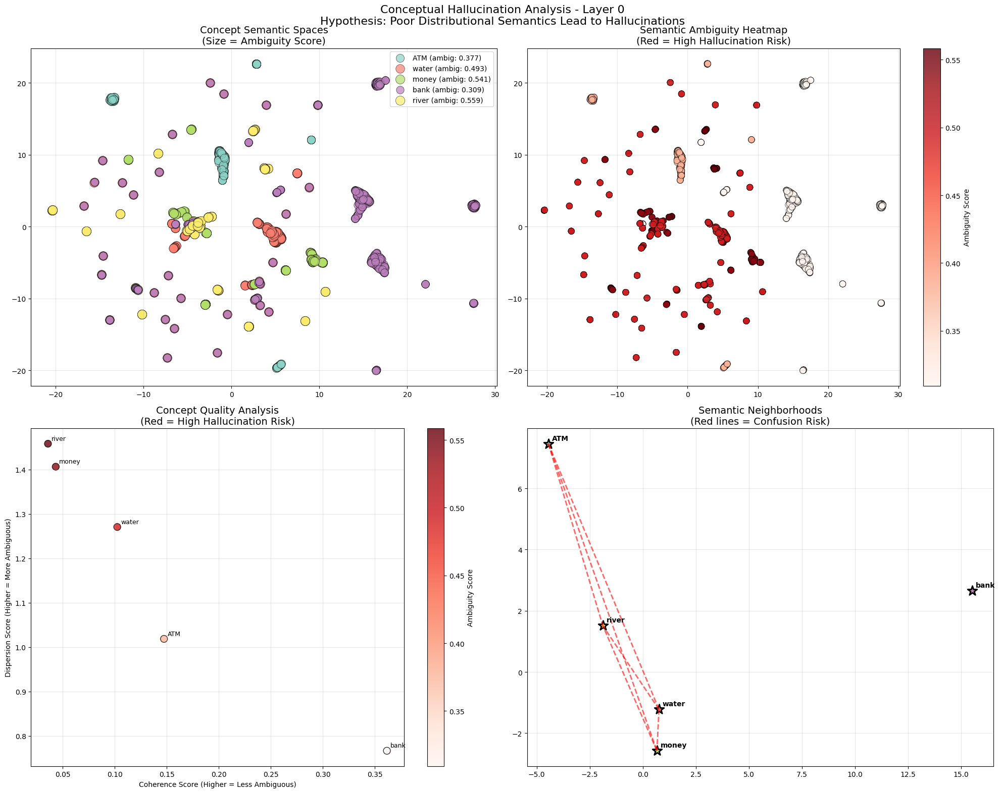

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


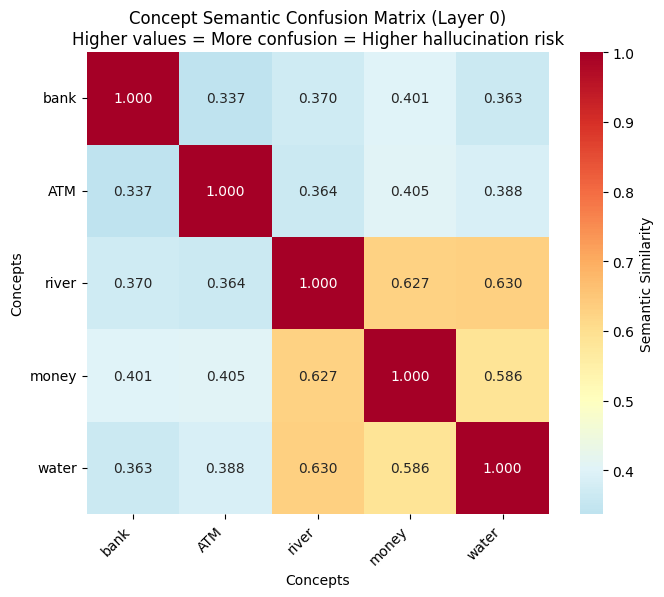


Analyzing layer 1...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Successfully applied UMAP


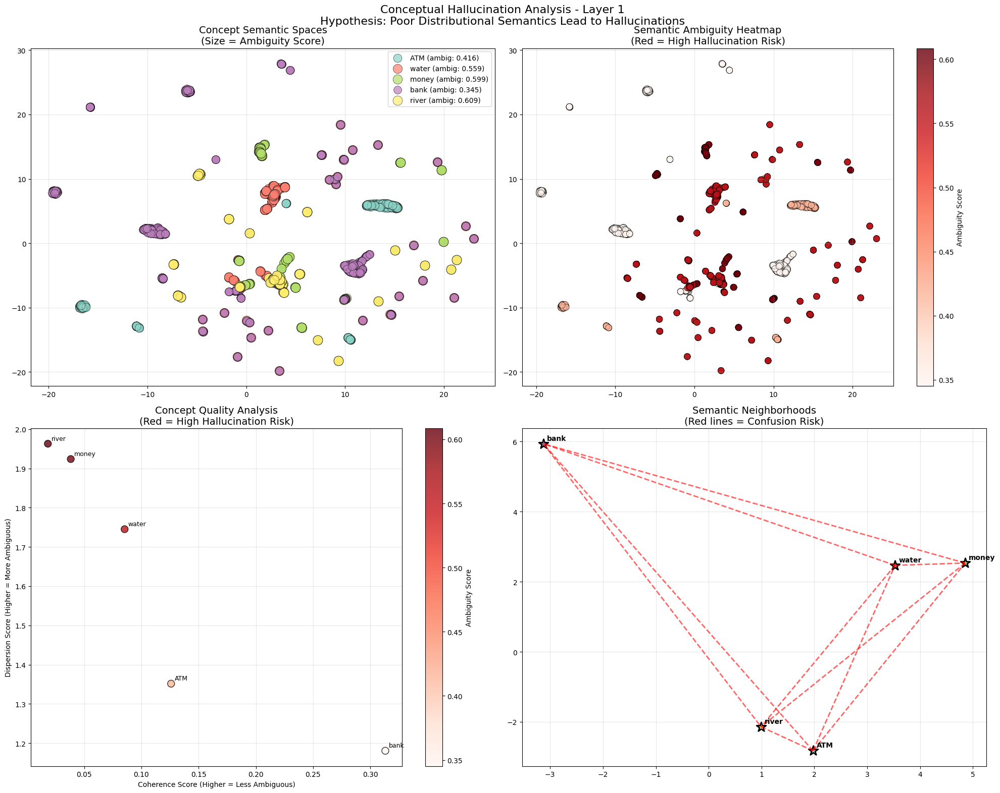

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


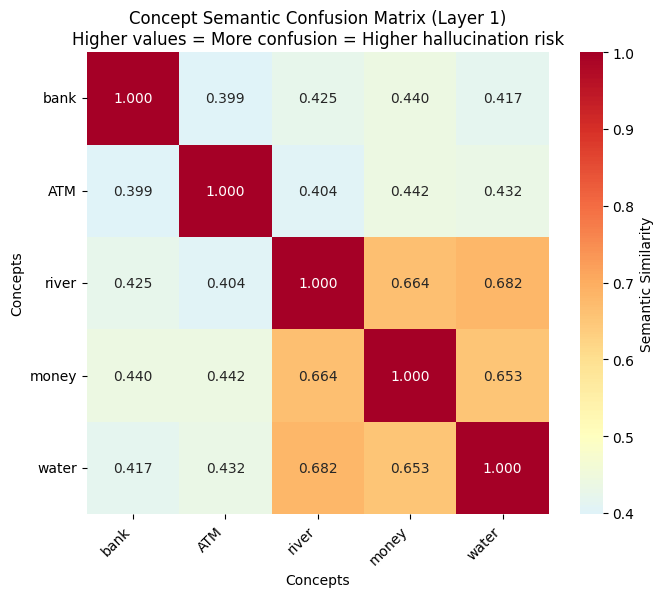


Analyzing layer 2...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


Successfully applied UMAP


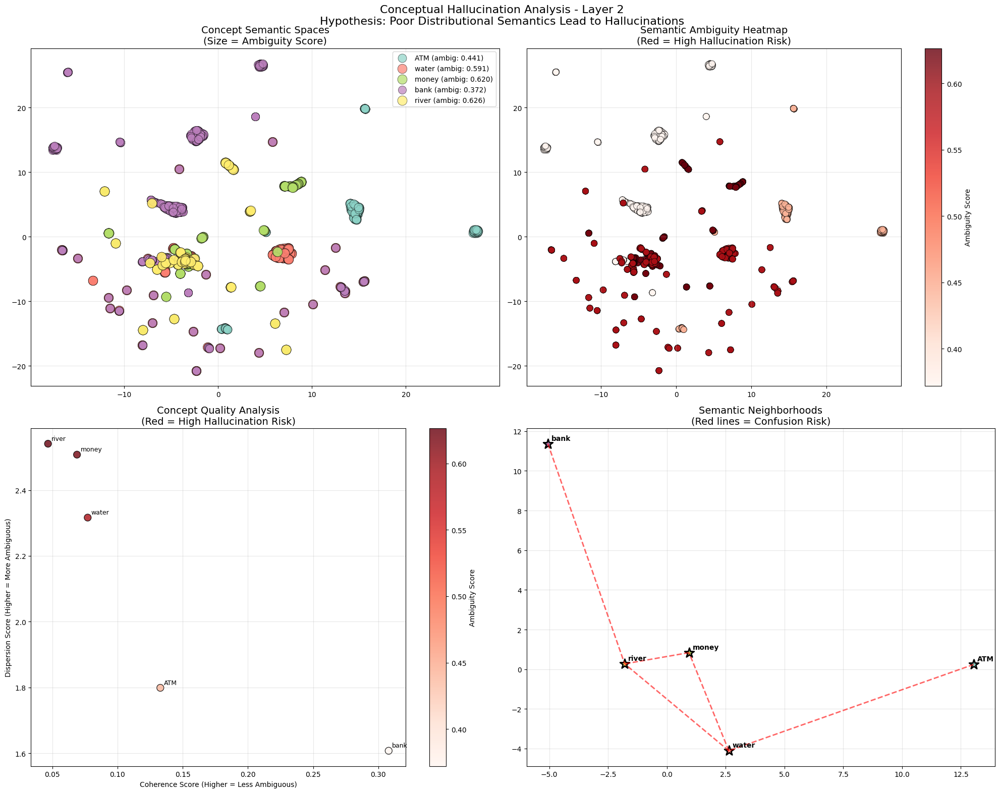

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


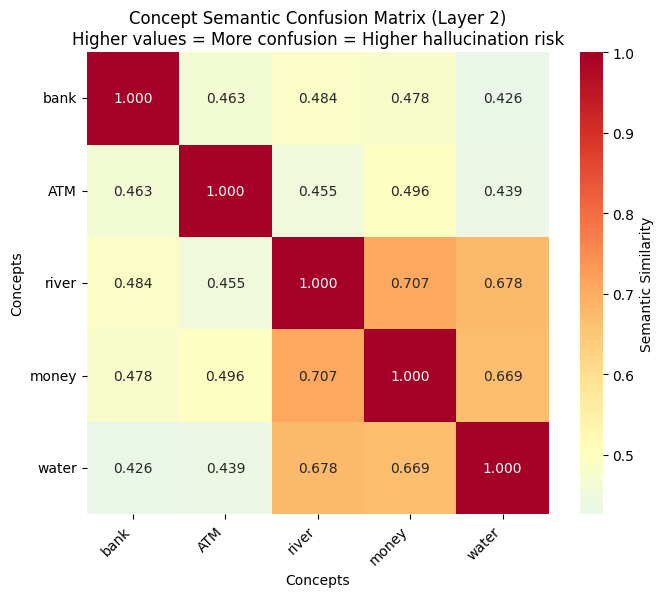


Analyzing layer 3...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


Successfully applied UMAP


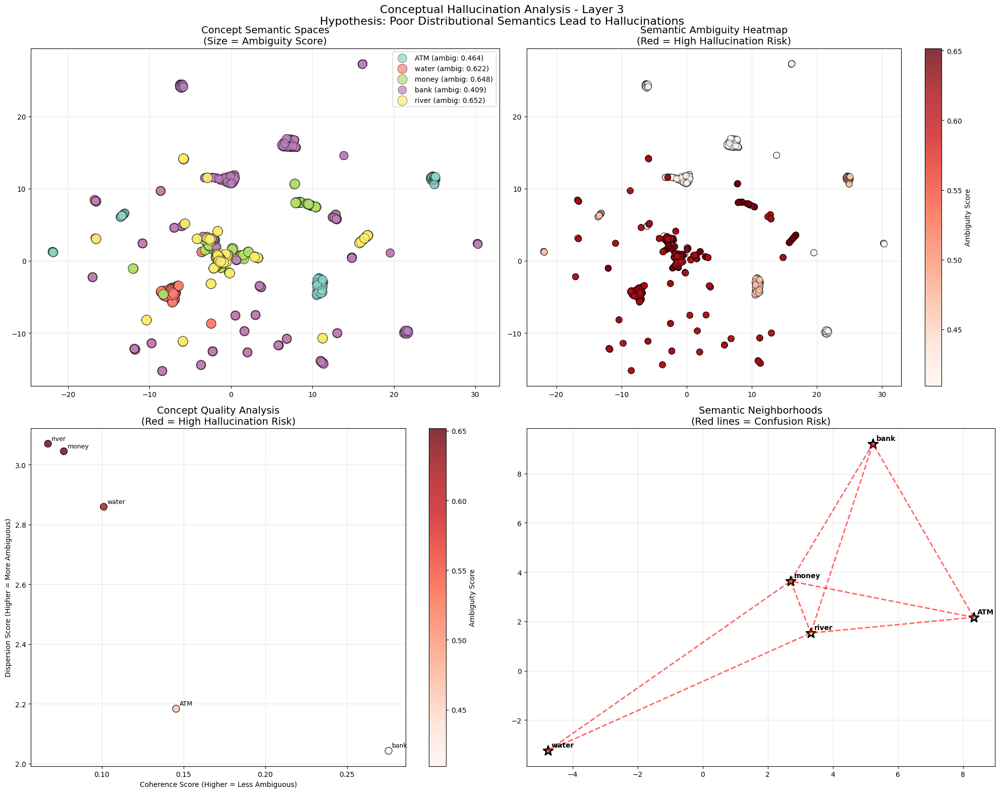

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


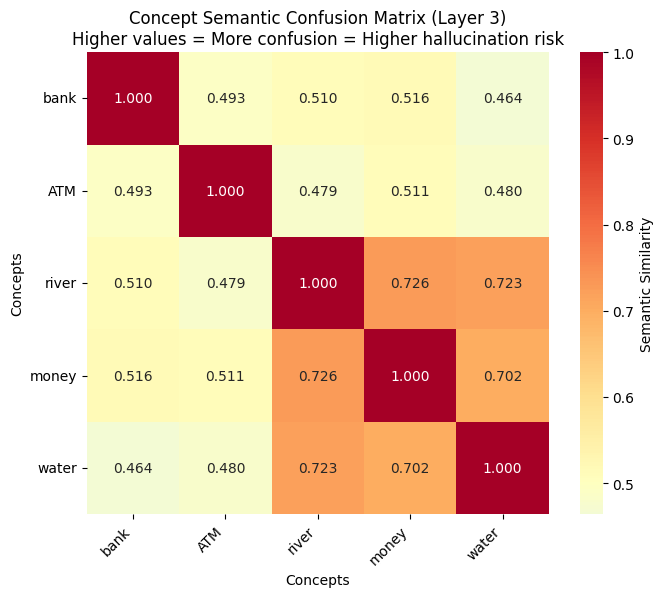


Analyzing layer 4...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Successfully applied UMAP


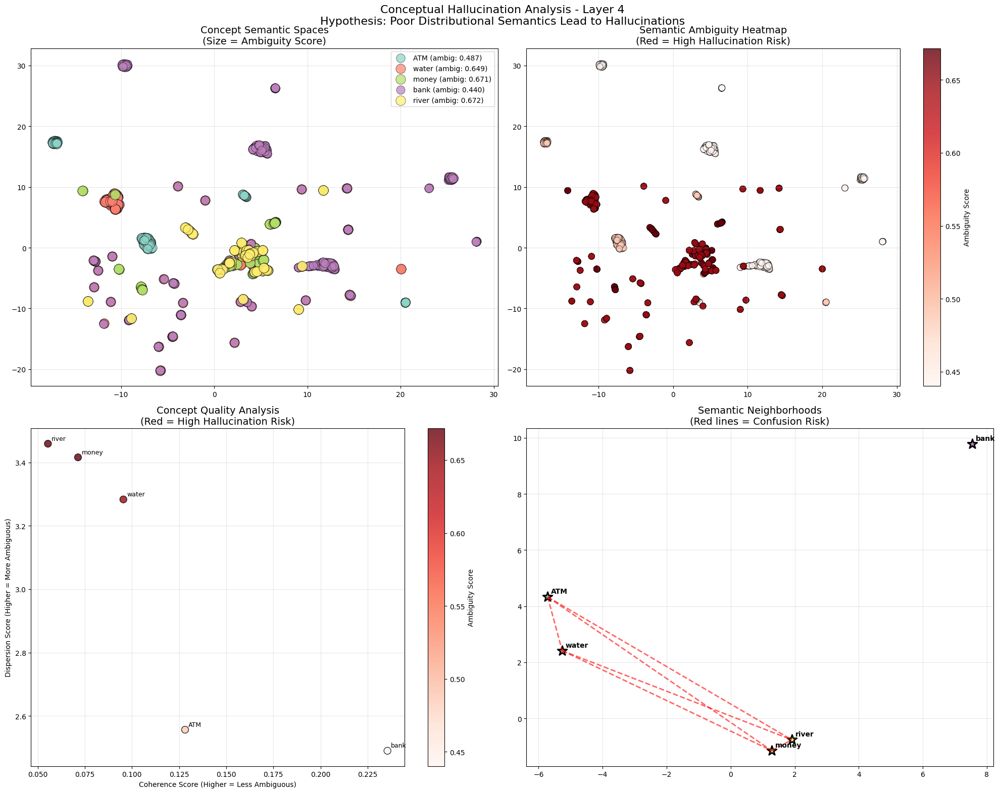

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


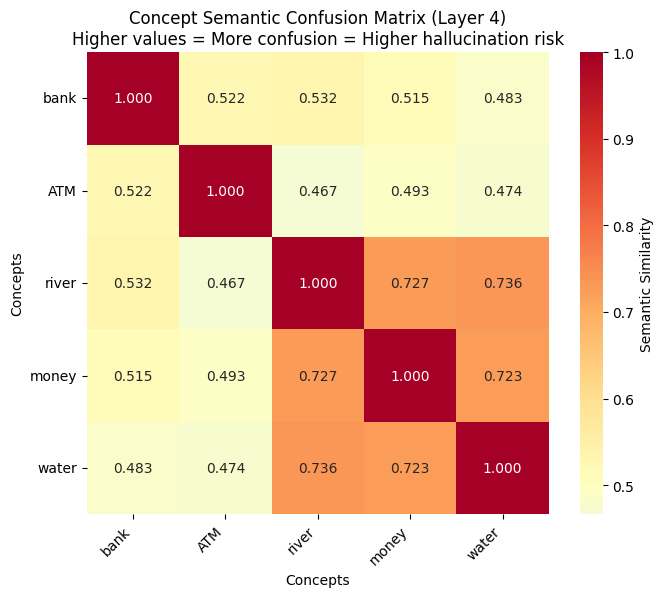


Analyzing layer 5...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Successfully applied UMAP


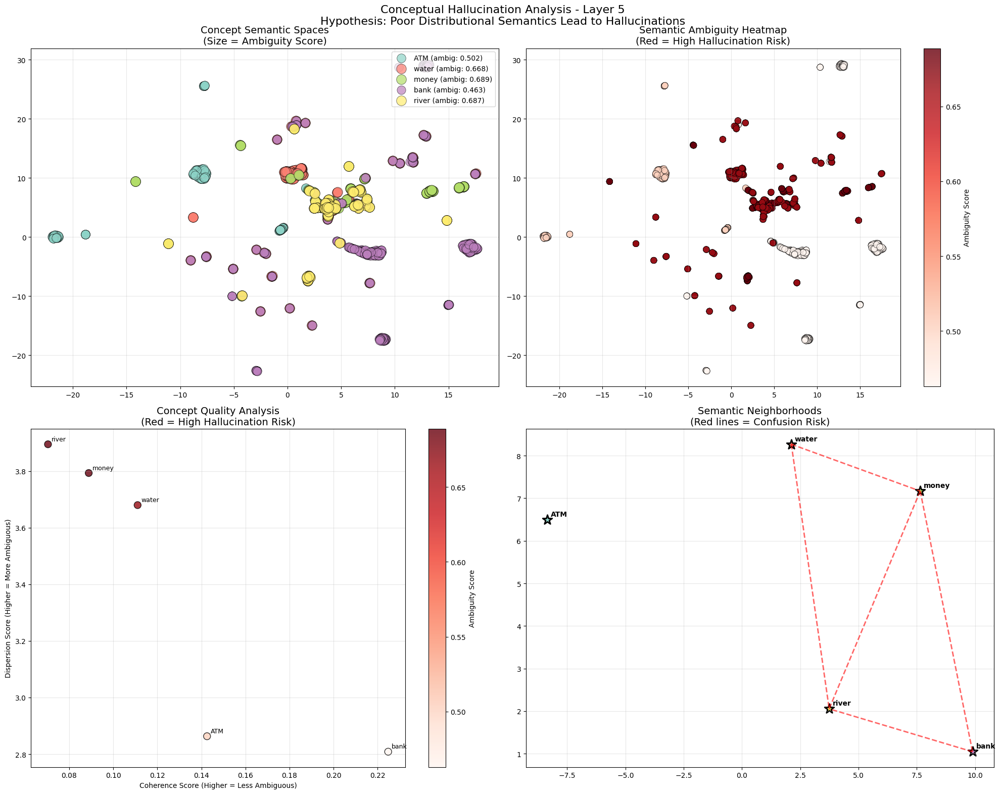

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


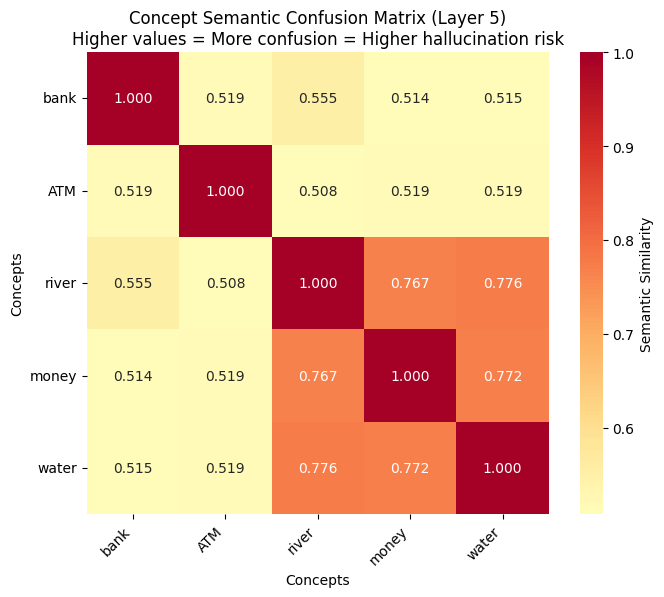


Analyzing layer 6...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Successfully applied UMAP


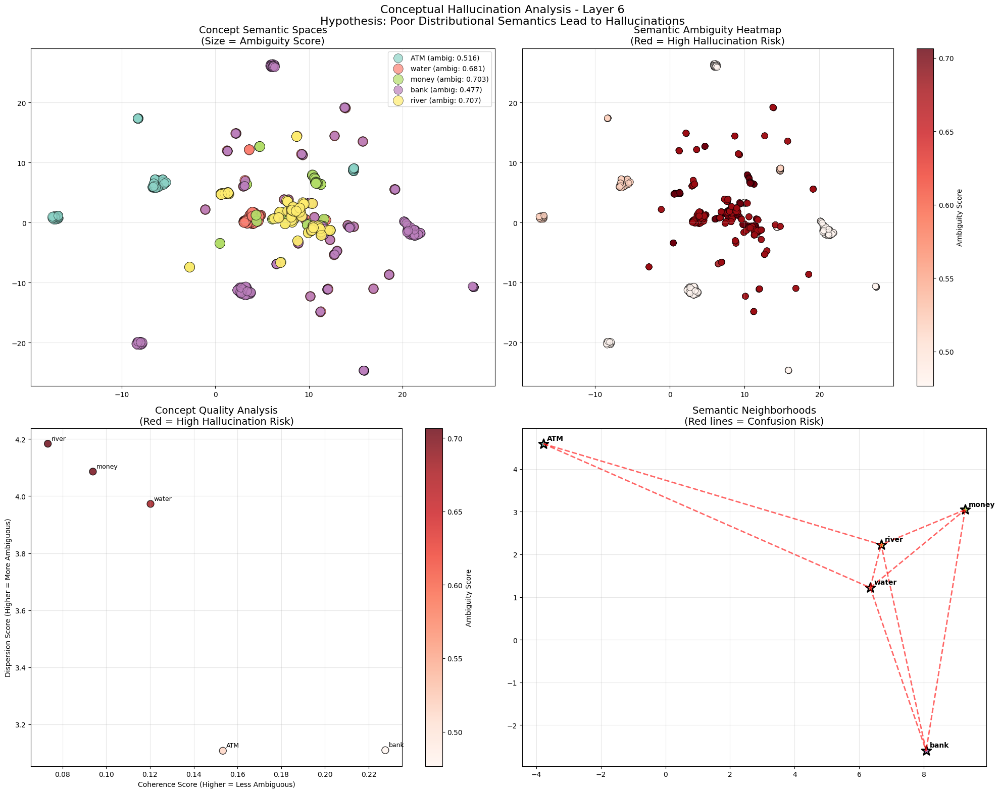

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


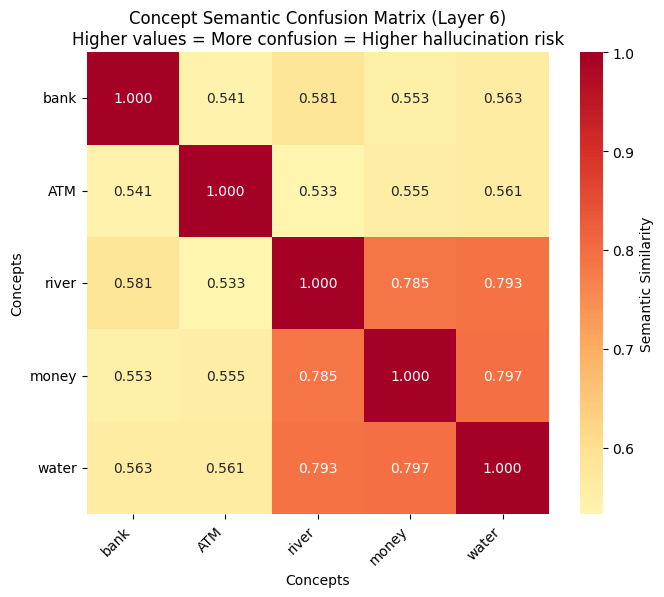


Analyzing layer 7...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Successfully applied UMAP


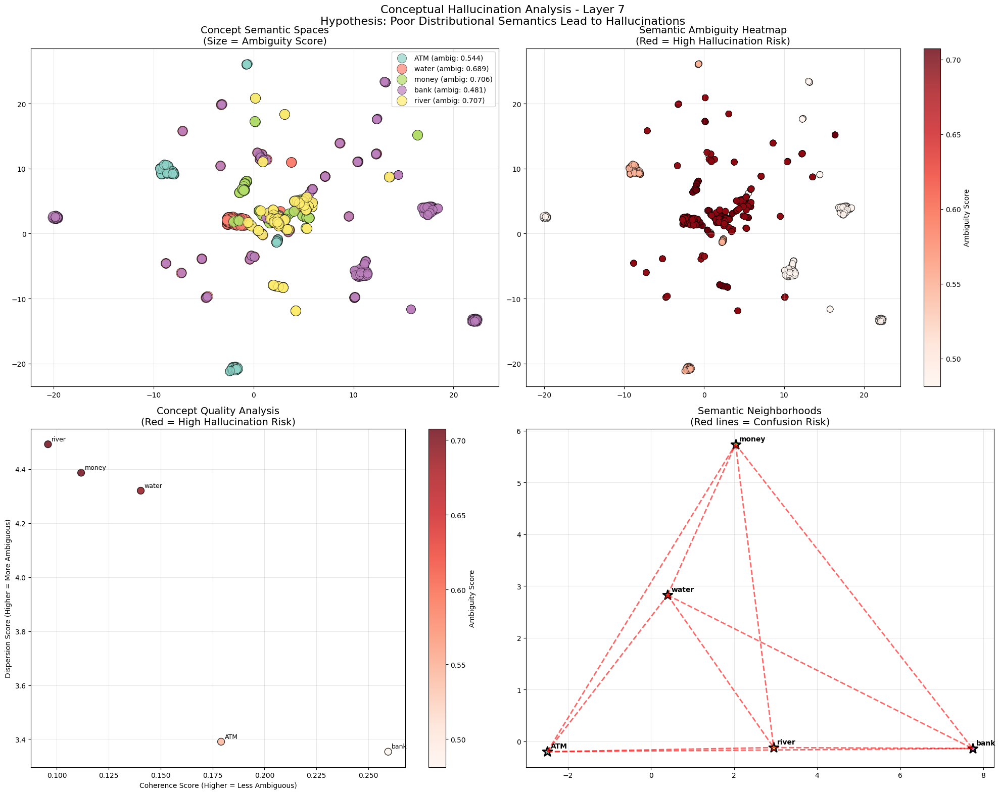

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


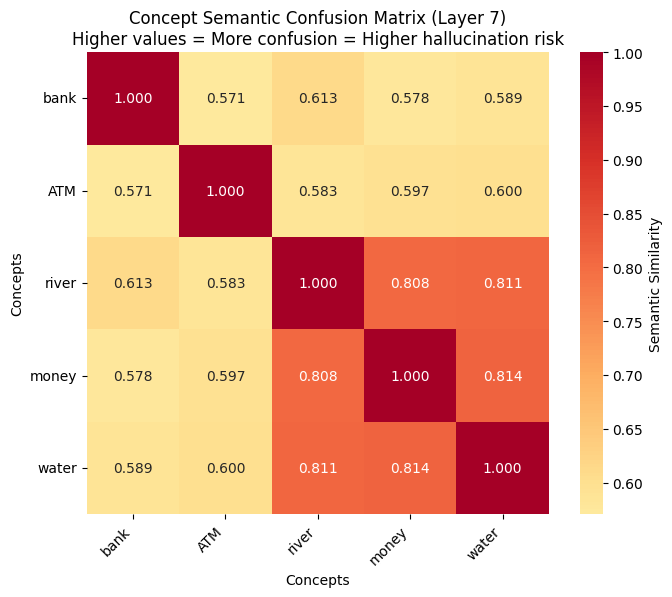


Analyzing layer 8...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Successfully applied UMAP


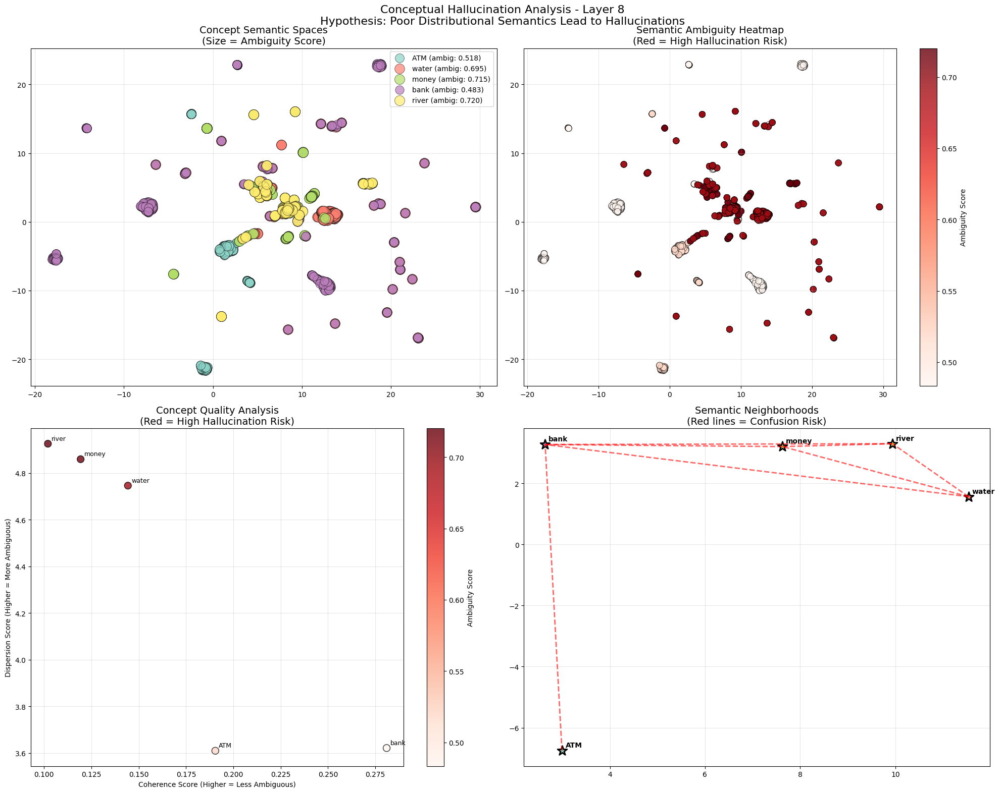

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


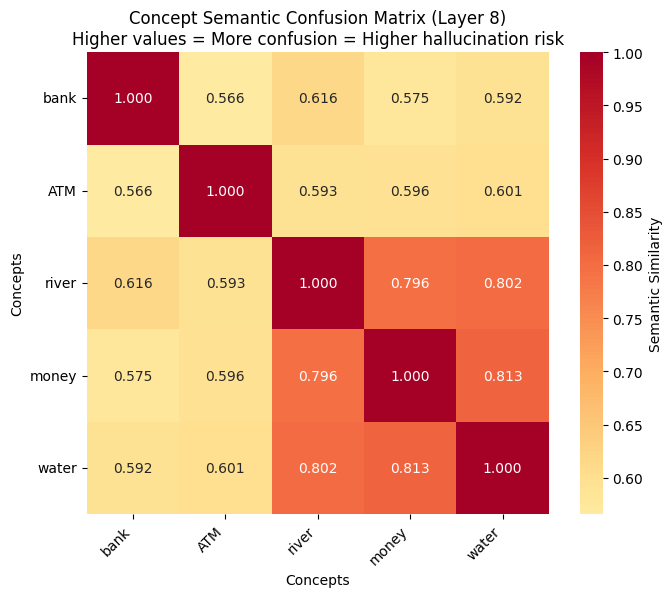


Analyzing layer 9...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Successfully applied UMAP


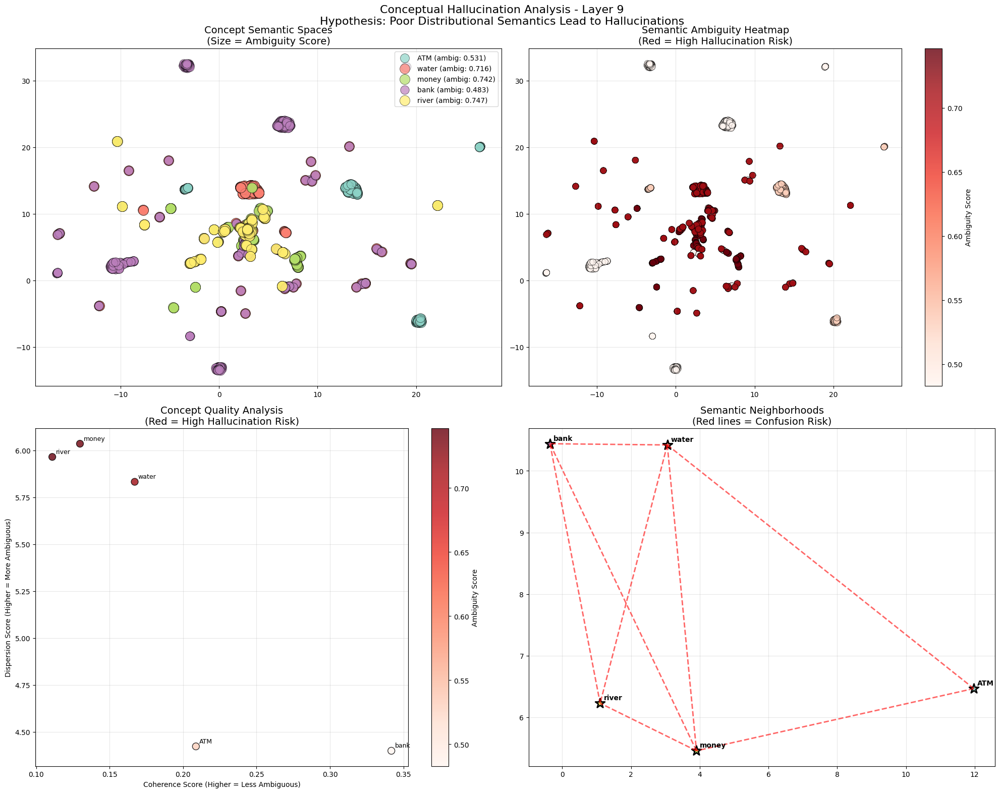

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


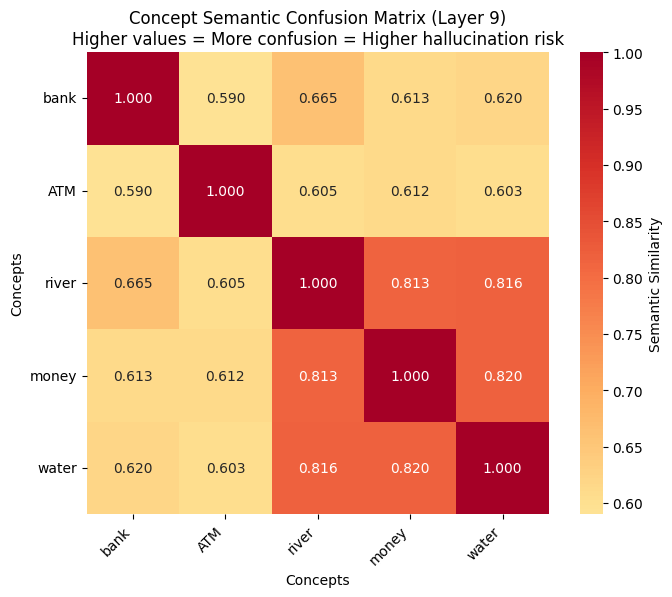


Analyzing layer 10...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


Successfully applied UMAP


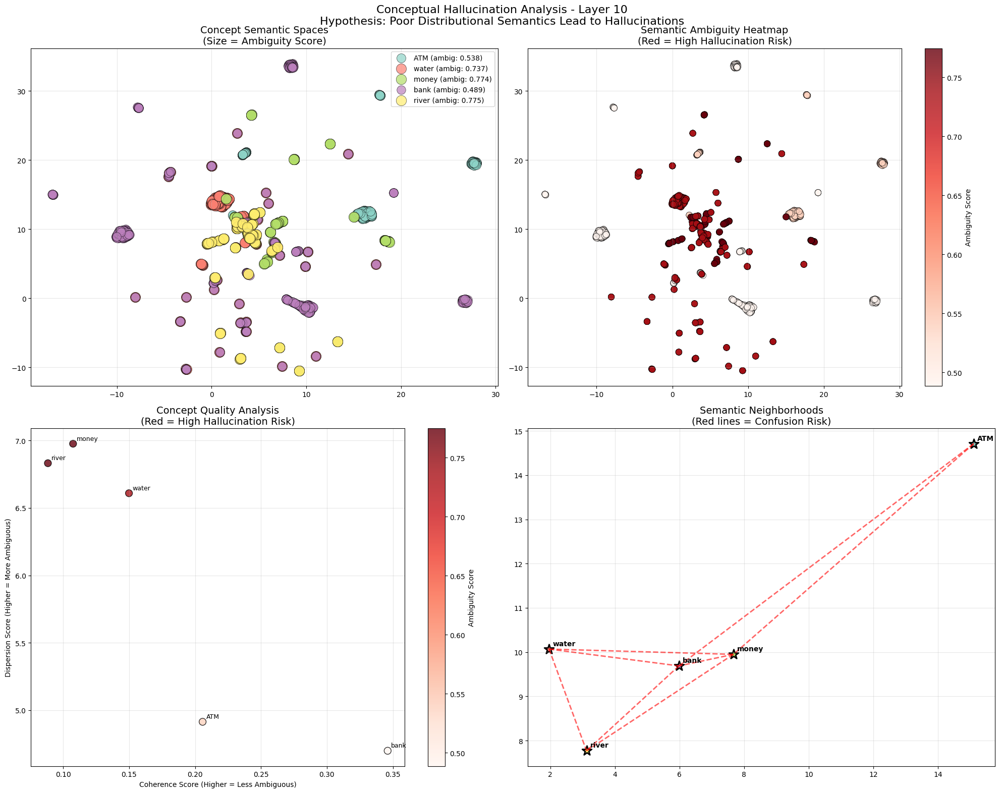

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


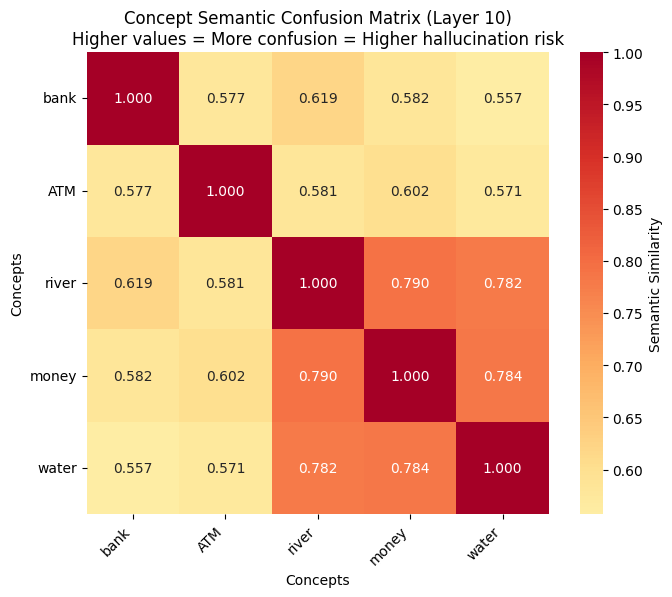


Analyzing layer 11...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


Successfully applied UMAP


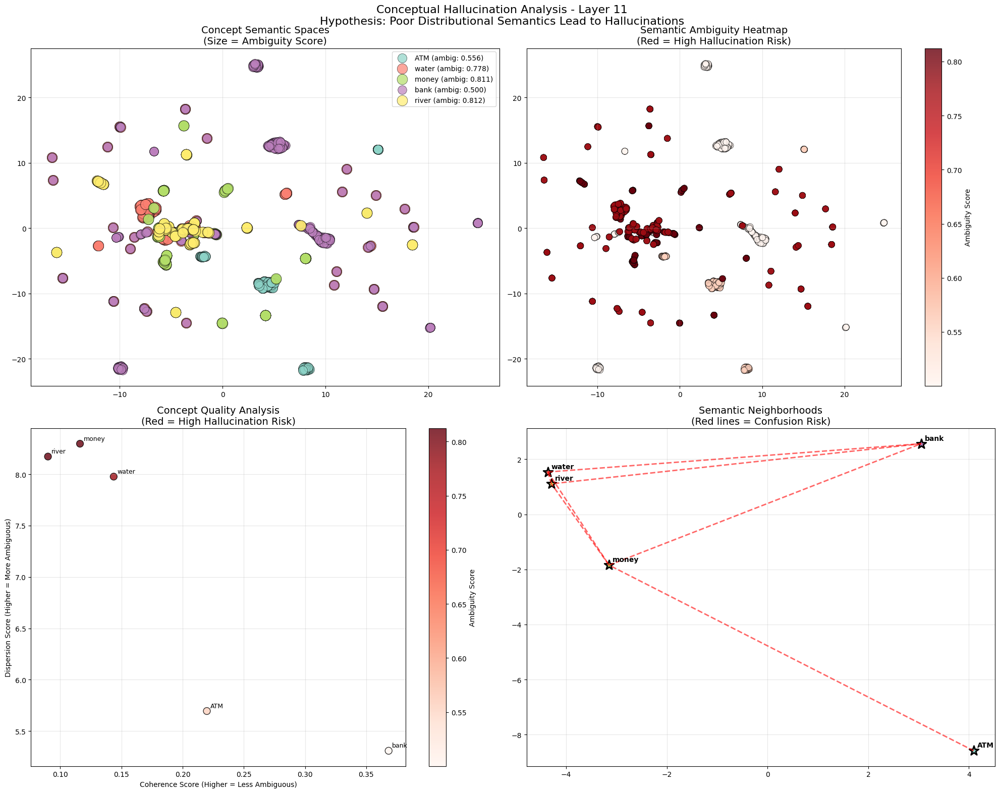

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


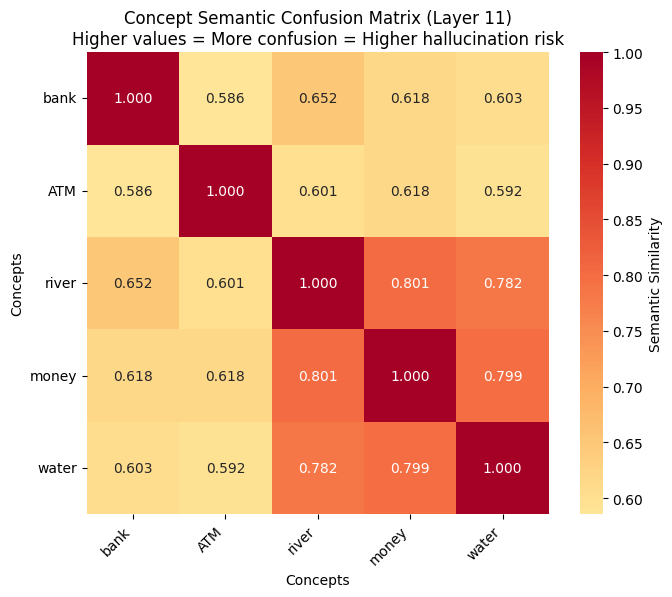


Analyzing layer 12...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Successfully applied UMAP


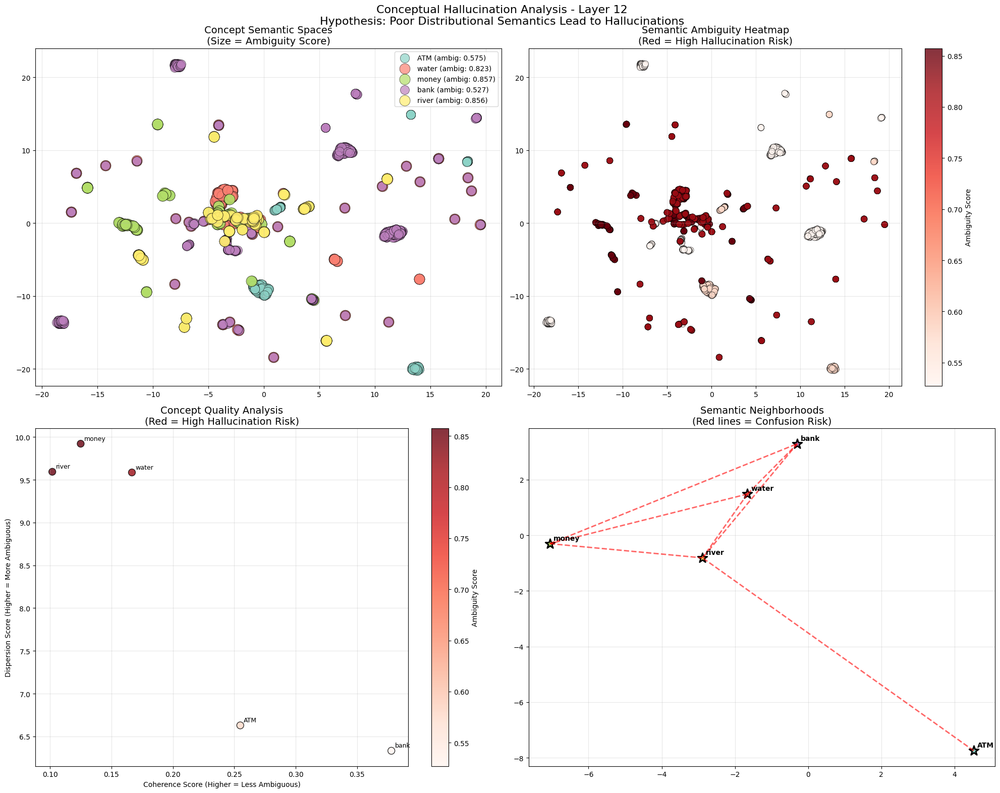

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


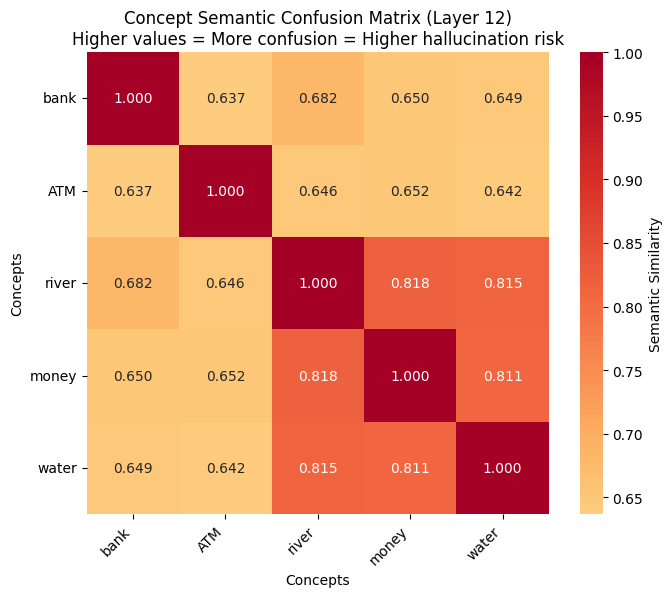


Analyzing layer 13...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


Successfully applied UMAP


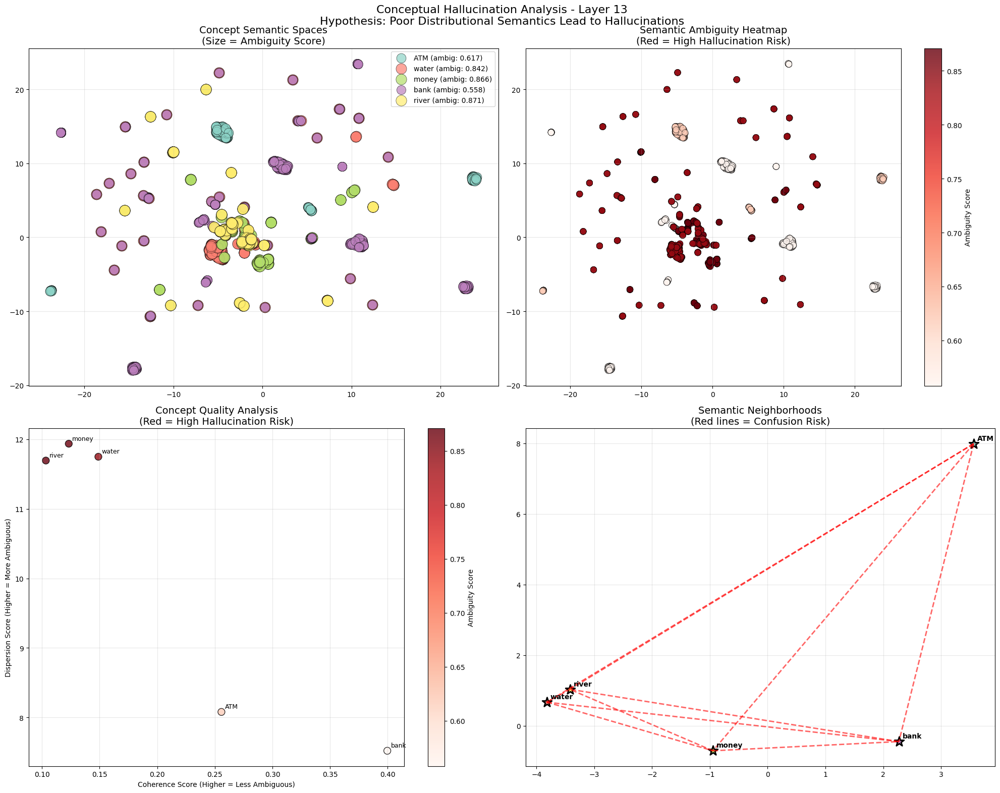

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


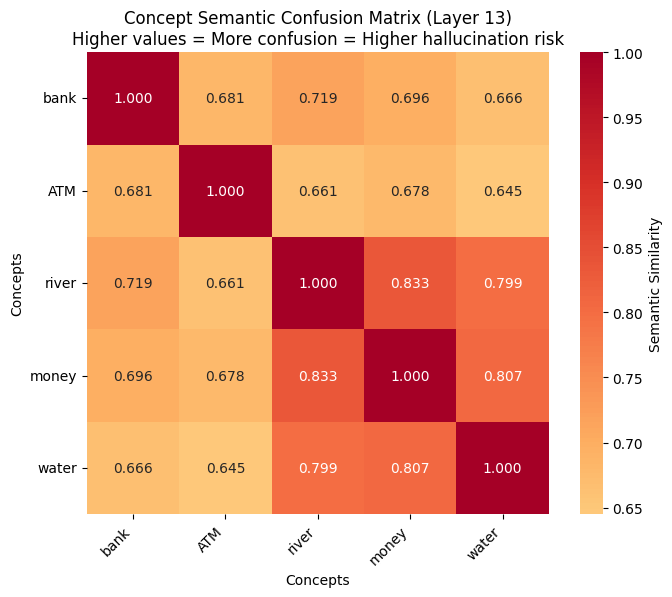


Analyzing layer 14...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


Successfully applied UMAP


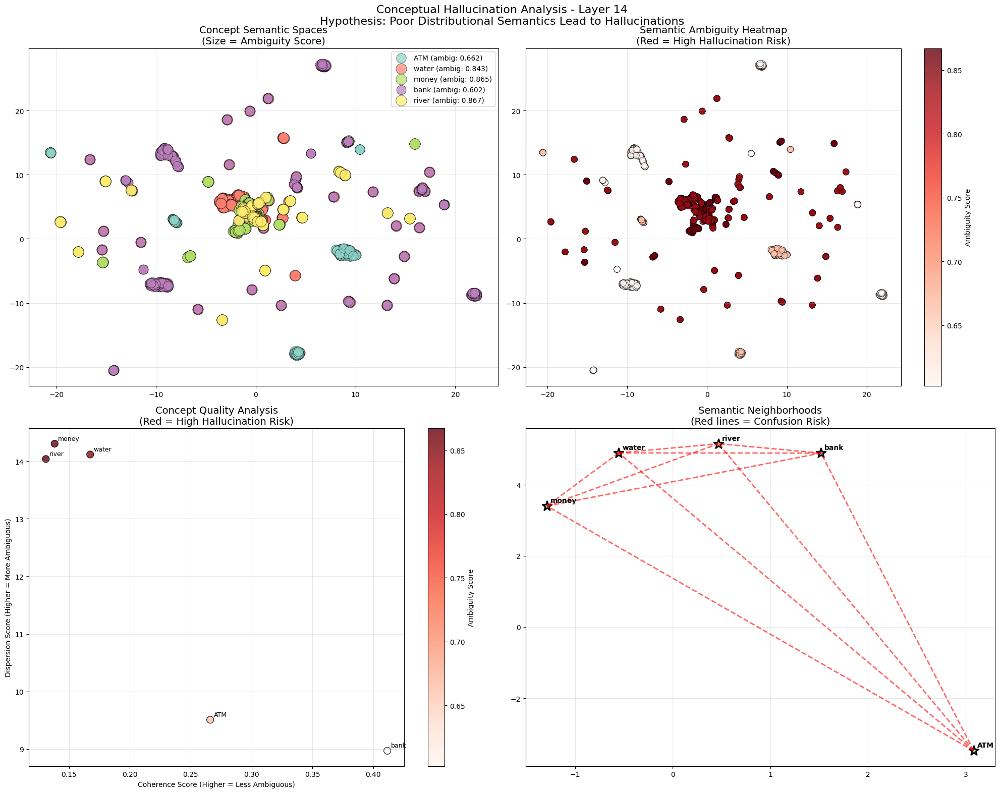

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


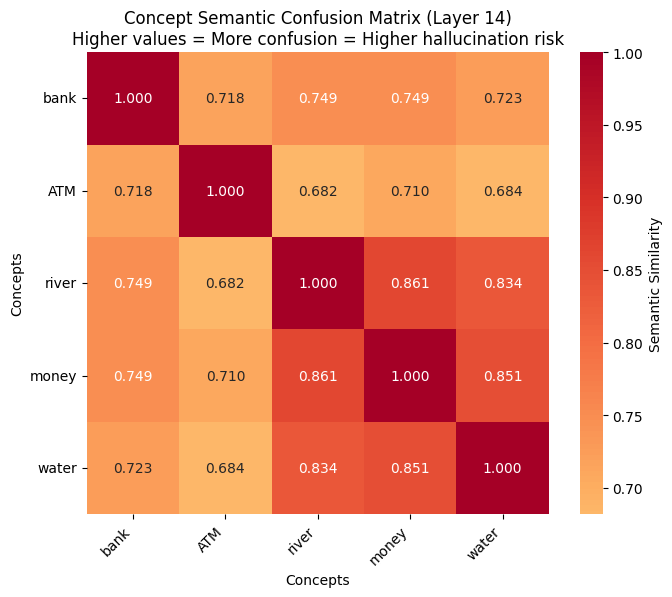


Analyzing layer 15...
Visualizing 2233 embeddings from 5 concepts
Reducing dimensionality for visualization...
PCA reduced dimensions from 2048 to 50


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Successfully applied UMAP


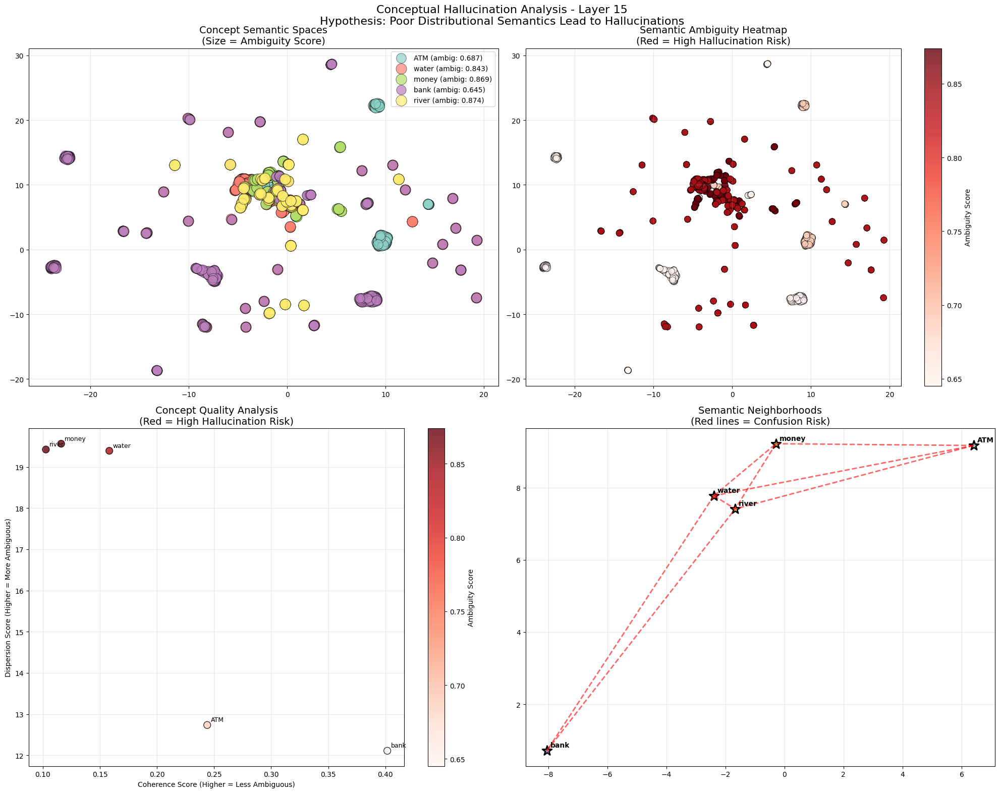

Creating confusion matrix for 5 concepts: ['bank', 'ATM', 'river', 'money', 'water']


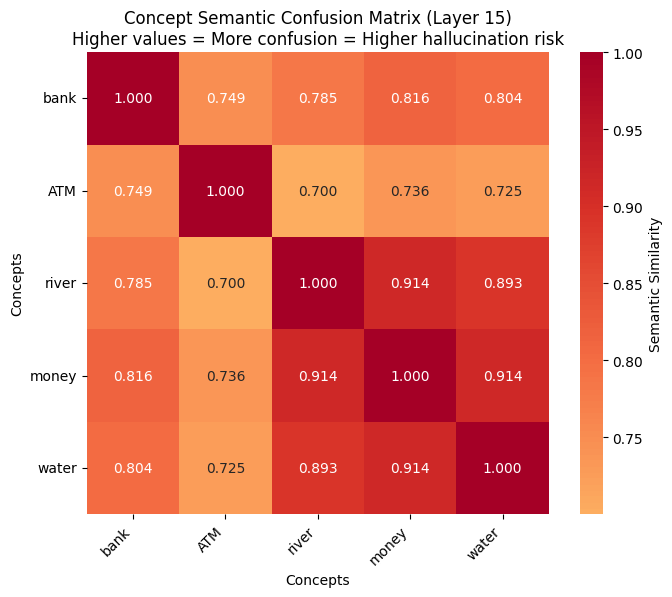

Layer comparison report saved to: prompt_analysis_results/layer_comparison_report.txt

ANALYSIS COMPLETE!

Prompt analyzed: John is going fishing, so he walks over to the bank. John realizes that he doesn't have any cash on him. Can he make an ATM transaction at this bank?
Concepts analyzed: ['bank', 'river', 'money', 'ATM', 'water']
Results saved to: prompt_analysis_results/

Key findings by layer:
  Layer 0: Average ambiguity = 0.456 (MEDIUM risk)
  Layer 1: Average ambiguity = 0.506 (MEDIUM risk)
  Layer 2: Average ambiguity = 0.530 (MEDIUM risk)
  Layer 3: Average ambiguity = 0.559 (MEDIUM risk)
  Layer 4: Average ambiguity = 0.584 (MEDIUM risk)
  Layer 5: Average ambiguity = 0.602 (MEDIUM risk)
  Layer 6: Average ambiguity = 0.617 (MEDIUM risk)
  Layer 7: Average ambiguity = 0.626 (MEDIUM risk)
  Layer 8: Average ambiguity = 0.626 (MEDIUM risk)
  Layer 9: Average ambiguity = 0.644 (MEDIUM risk)
  Layer 10: Average ambiguity = 0.662 (MEDIUM risk)
  Layer 11: Average ambiguity = 0.6

In [ ]:
prompt = "John is going fishing, so he walks over to the bank. John realizes that he doesn't have any cash on him. Can he make an ATM transaction at this bank?"
target_tokens = ["bank", "river", "money", "finance", "water"]

analyze_prompt_main(
        prompt=prompt,
        target_concepts=target_tokens,
        model_name="meta-llama/Llama-3.2-1B-Instruct",
        dataset_name="allenai/olmo-mix-1124",
        max_samples=5000
)